In [1]:
#pressure Based Analysis

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from IPython.display import HTML

In [3]:
! python --version

Python 3.11.4


In [4]:
directory = 'NZ Data/DTU Data/data/'
entries = os.listdir(directory)
entries_new = [e.split('_')[0] for e in entries] #without extension and so on.
# Define a color palette for different sheets

sheet_colors = {
    'Kokpanna1': 'tab:blue',
    'Kokpanna2': 'tab:red',
    'Kokpanna4': 'tab:green',
    'Kokpanna5': 'k',  # Black
}

sheet_names=[]
counter=0

data_dict = {}
for e, path in tqdm(zip(entries_new, entries), desc='Data files read'):
    data_dict[e] = pd.read_excel(os.path.join(directory, path))
    # Clean data by replacing "(null)" with NaN
    data_dict[e] = data_dict[e].replace("(null)", float("NaN"))

    # Convert the 'Time' column to datetime
    data_dict[e]['Time'] = pd.to_datetime(data_dict[e]['Time'], format='%d-%m-%Y %H:%M')

    # Create subplots for each column
    
    sns.set_style('whitegrid')
    #color= sheet_colors[sheet]


Data files read: 4it [01:08, 17.05s/it]


In [5]:
columns = data_dict[entries_new[0]].keys()
columns_to_plot = columns[1:]
colors = ['tab:blue', 'tab:red', 'tab:green', 'k']

In [6]:
data_list = [data_dict[e] for e in entries_new]

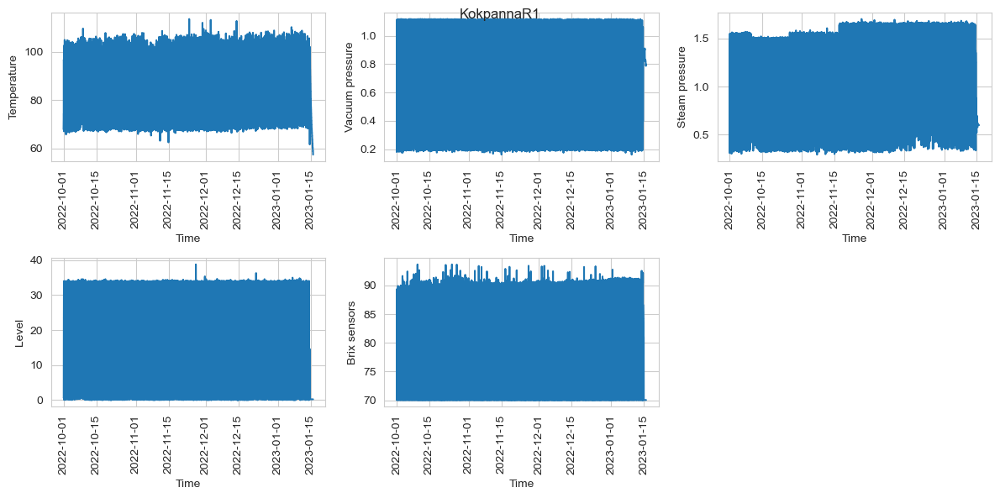

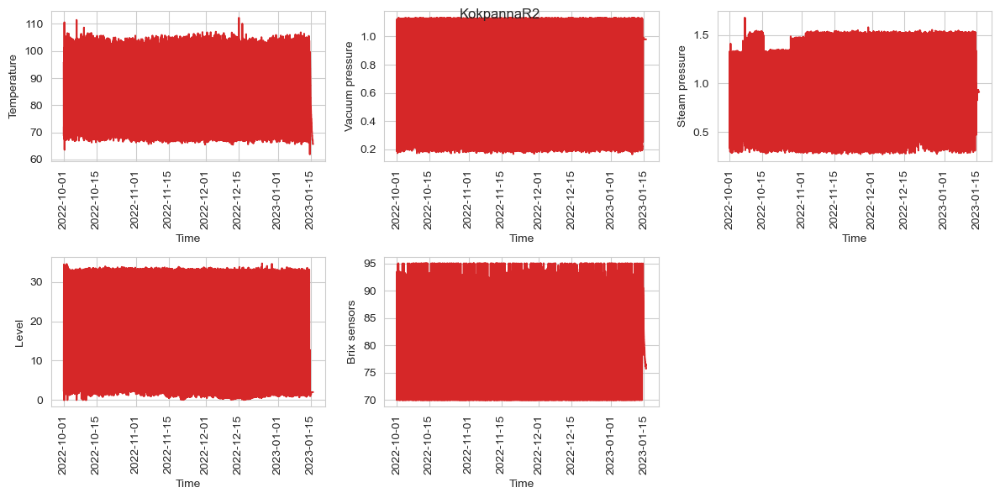

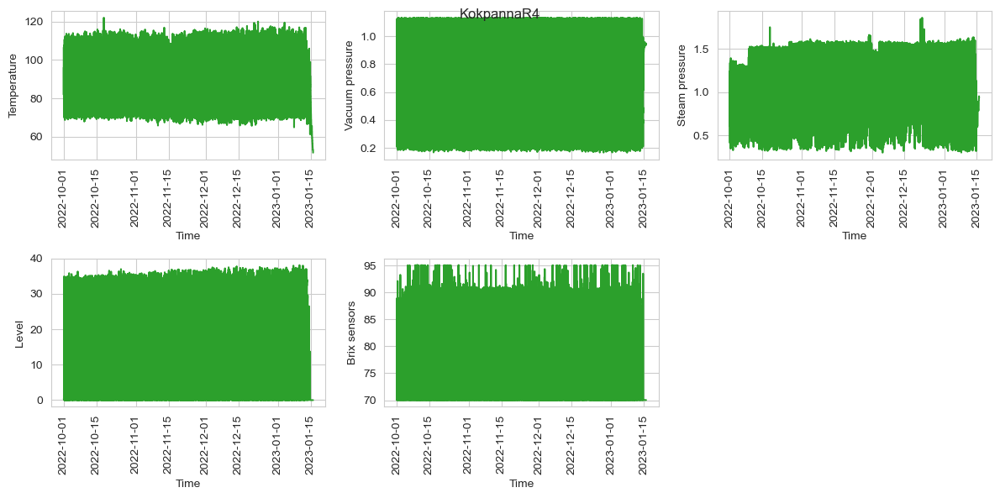

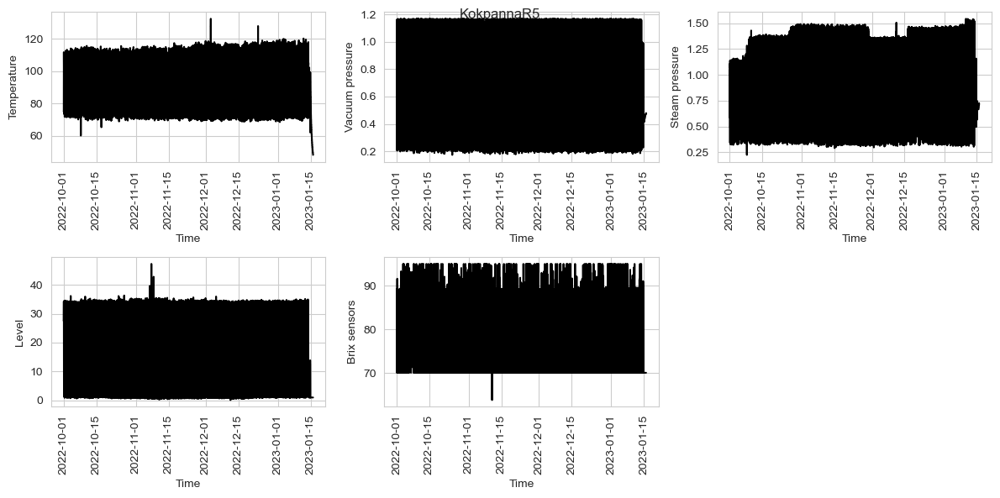

In [7]:
for index, e in enumerate(entries_new):
    plt.figure(figsize=(12, 6))
    for c, col in enumerate(columns_to_plot):
        plt.subplot(2, 3, c+1)
        plt.plot(data_list[index]['Time'], data_list[index][col], color=colors[index])
        plt.xticks(rotation=90)
        plt.xlabel('Time')
        plt.ylabel(col)
    plt.tight_layout()
        
    plt.suptitle(e)

In [8]:
# Assuming data_list is your list of DataFrames
# Initialize an empty dictionary to store the OWP DataFrames for each tank
OWP = {}

# Iterate over each DataFrame in data_list
for index, df in enumerate(data_list):
    # Filter rows based on pressure between 0.15 and 0.35
    owp_df = df[(df['Vacuum pressure'] >= 0.15) & (df['Vacuum pressure'] <= 0.35)]
    
    # Store the filtered DataFrame in the dictionary with the tank index as the key
    OWP[index] = owp_df

In [9]:
import datetime

start_time = datetime.datetime(2022, 10, 1)
end_time = datetime.datetime(2023, 1, 15)

OWPT = OWP[3].loc[(OWP[3]['Time'] >= start_time) & (OWP[3]['Time'] <= end_time)]

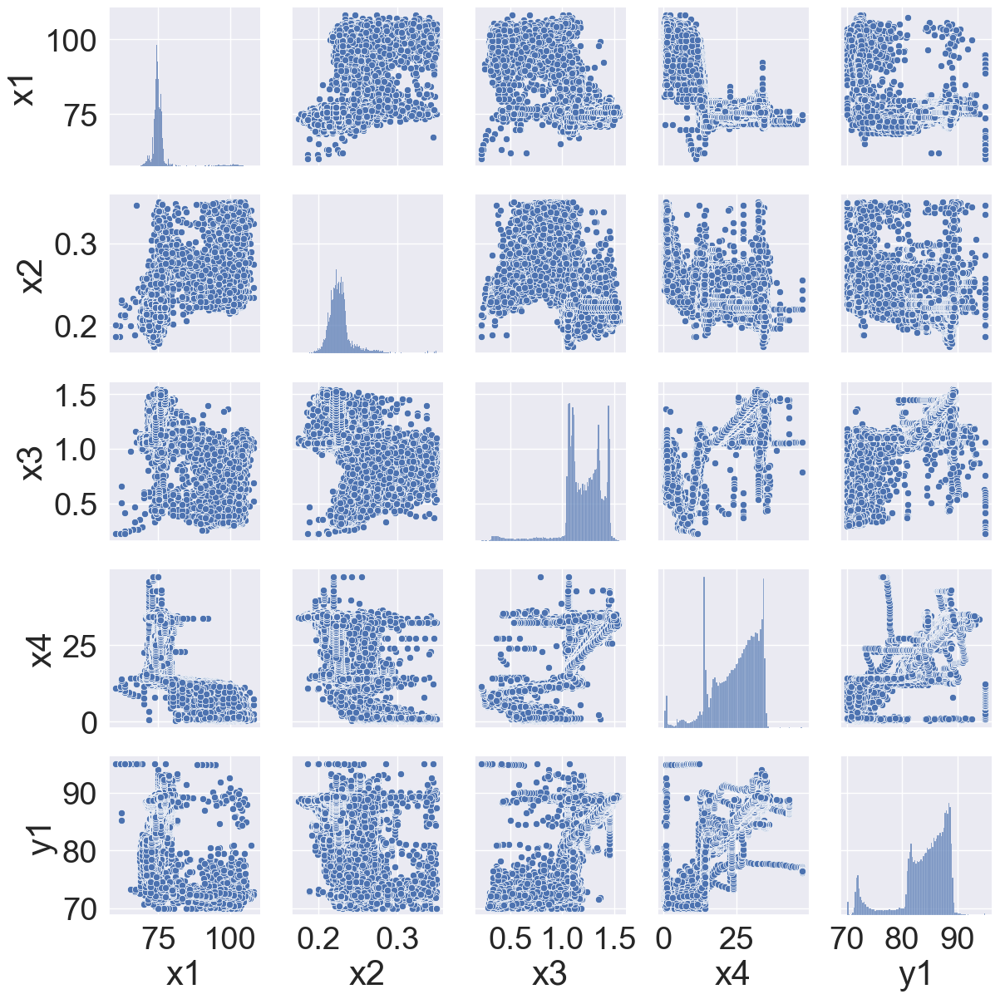

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the size and font scale
sns.set(rc={'figure.figsize': (12, 8)})
sns.set(font_scale=2.5)

# Create the pairplot
plot = sns.pairplot(OWPT)

# Set custom labels for the axes
plot.axes[0, 0].set_ylabel('x1')
plot.axes[1, 0].set_ylabel('x2')
plot.axes[2, 0].set_ylabel('x3')
plot.axes[3, 0].set_ylabel('x4')
plot.axes[4, 0].set_ylabel('y1')

# Set custom labels for x-axes
plot.axes[4, 0].set_xlabel('x1')
plot.axes[4, 1].set_xlabel('x2')
plot.axes[4, 2].set_xlabel('x3')
plot.axes[4, 3].set_xlabel('x4')
plot.axes[4, 4].set_xlabel('y1')

# Show the plot
plt.show()


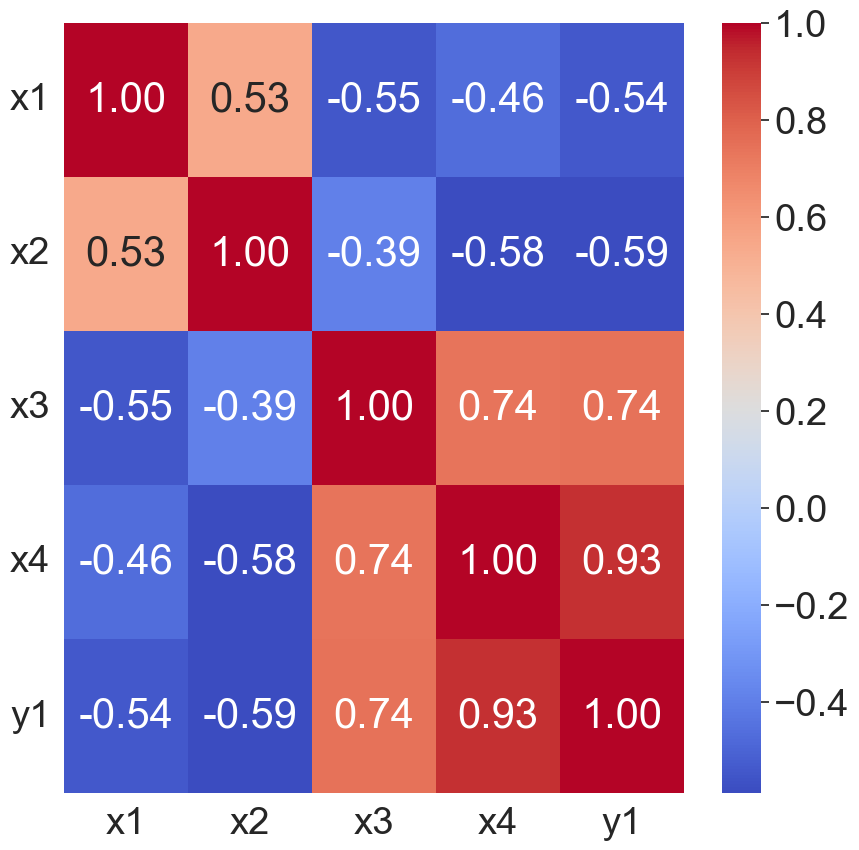

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Excluding 'Time' column
columns_to_exclude = ['Time']

# Filter the dataframe to exclude the specified columns
filtered_OWPT = OWPT.drop(columns=columns_to_exclude, errors='ignore')

# Calculate the correlation matrix for the filtered dataframe
CM_OWPT = filtered_OWPT.corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 10))
heatmap = sns.heatmap(CM_OWPT, annot=True, cmap='coolwarm', fmt=".2f")

# Set custom labels for both x-axis and y-axis
new_labels = ['x1', 'x2', 'x3', 'x4', 'y1']
heatmap.set_xticklabels(new_labels, rotation=0)
heatmap.set_yticklabels(new_labels)

# Set font scale
sns.set(font_scale=2.5)

plt.show()


In [12]:
OWPT= OWPT.reset_index()

In [13]:
#BDP: Batch Data Base Pressure
Bench = OWPT['Time'].diff()
batch_change_indices = OWPT.index[Bench > pd.Timedelta(minutes=1)]
BDP = []
start_idx = 0
for idx in batch_change_indices:
    BDP.append(OWPT.iloc[start_idx:idx])
    start_idx = idx
BDP.append(OWPT.iloc[start_idx:])

In [29]:
HTML(BDP[0] .to_html(index=False))

index,Time,Temperature,Vacuum pressure,Steam pressure,Level,Brix sensors
0,2022-10-01 00:00:00,74.964249,0.228068,1.083844,27.541656,84.800995
1,2022-10-01 00:01:00,74.964249,0.228068,1.083844,27.541656,84.913147
2,2022-10-01 00:02:00,74.964249,0.228068,1.083844,27.541656,85.129425
3,2022-10-01 00:03:00,74.964249,0.228068,1.083844,27.541656,85.129425
4,2022-10-01 00:04:00,74.964249,0.228068,1.083844,28.068485,85.233551
5,2022-10-01 00:05:00,74.964249,0.228068,1.083844,28.595633,85.233551
6,2022-10-01 00:06:00,74.964249,0.228068,1.083844,28.595633,85.233551
7,2022-10-01 00:07:00,74.964249,0.228068,1.083844,28.595633,85.353706
8,2022-10-01 00:08:00,74.964249,0.228068,1.083844,28.595633,85.473862
9,2022-10-01 00:09:00,74.964249,0.228068,1.083844,28.595633,85.577995


In [14]:
#OWPTB: Operating Window Pressure Based Time Frame with Batch number
OWPTB = pd.concat(BDP, ignore_index=True)

for i, df in enumerate(BDP):
    BDP[i] = df.copy()
    BDP[i].loc[:, 'Batch'] = i

OWPTB = pd.concat(BDP, ignore_index=True)

In [15]:
HTML(OWPTB .to_html(index=False))

index,Time,Temperature,Vacuum pressure,Steam pressure,Level,Brix sensors,Batch
66378,2022-11-16 01:18:00,101.061722,0.308834,0.819727,0.731610,72.208847,0
66379,2022-11-16 01:19:00,99.475685,0.263614,0.770517,1.294396,71.760277,0
66380,2022-11-16 01:20:00,99.475685,0.240042,0.507785,5.211788,71.752266,0
66381,2022-11-16 01:21:00,99.475685,0.228999,0.342591,6.782745,71.976547,0
66382,2022-11-16 01:22:00,97.937714,0.228999,0.321083,8.492416,72.088692,0
66383,2022-11-16 01:23:00,96.351677,0.241308,0.608096,10.451116,72.192825,0
66384,2022-11-16 01:24:00,93.179604,0.276639,0.946797,11.471840,72.401093,0
66385,2022-11-16 01:25:00,82.798294,0.287725,1.164053,12.687955,73.154060,0
66386,2022-11-16 01:26:00,77.511505,0.273865,1.136534,13.720116,73.482483,0
66387,2022-11-16 01:27:00,75.877419,0.247237,1.116373,13.720116,74.267487,0


In [14]:
OWPTB.to_excel('OWPTB.xlsx', index=True)

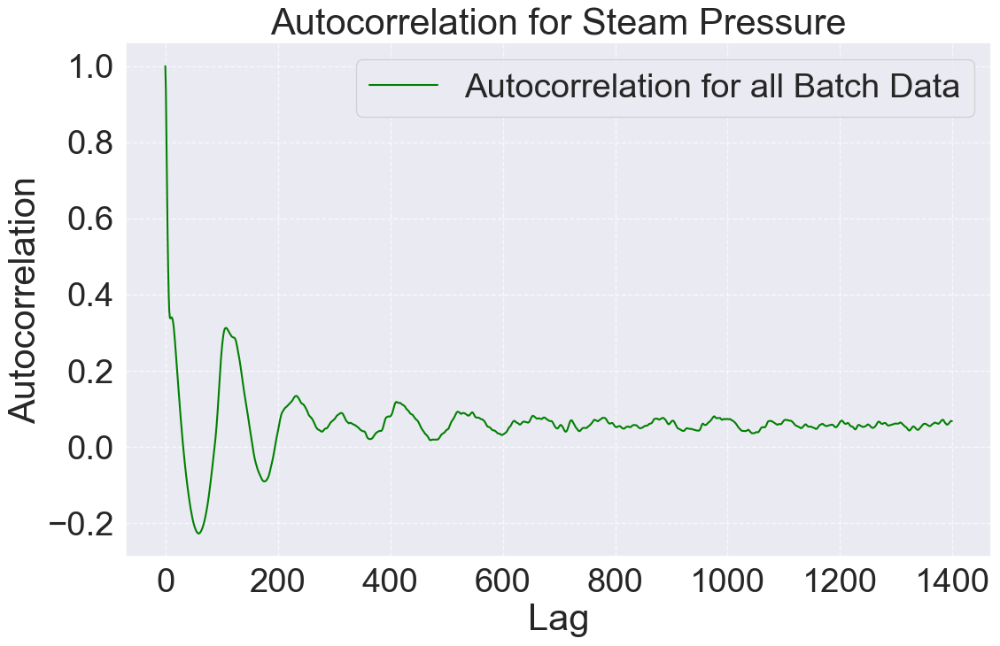

In [15]:
import matplotlib.pyplot as plt
import numpy as np

# Combine all batches into one dataset
combined_data = OWPTB['Steam pressure'].copy()

# Set the maximum lag
max_lag = 1400

# Calculate autocorrelation for the combined dataset
autocorr_values_combined = [combined_data.autocorr(lag=l) for l in range(max_lag)]

# Plot the autocorrelation for the combined dataset
plt.figure(figsize=(12, 8))
plt.plot(np.arange(max_lag), autocorr_values_combined, label='Autocorrelation for all Batch Data', color='green')

plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation for Steam Pressure')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

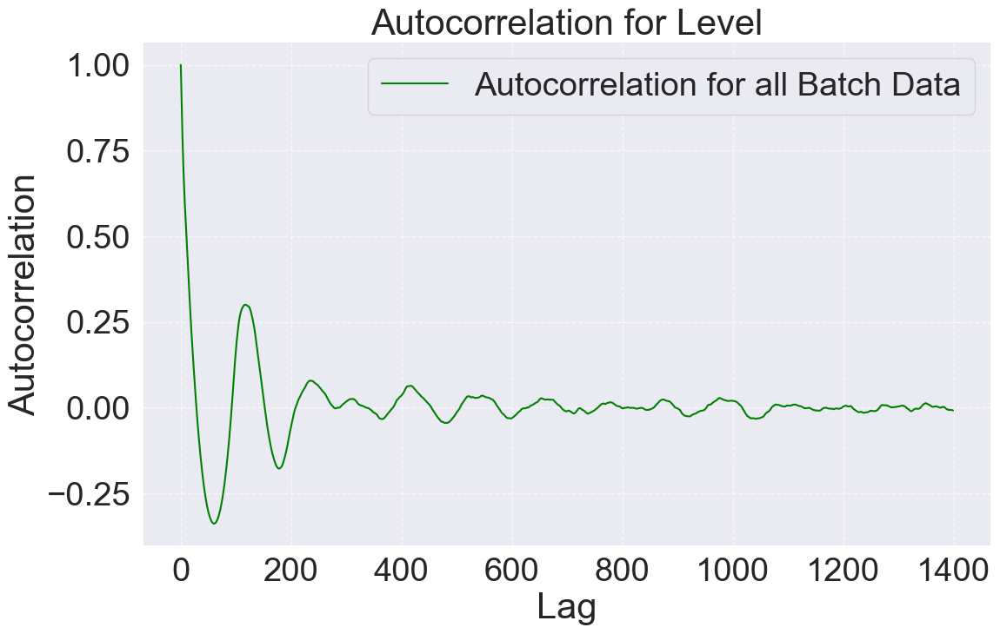

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Combine all batches into one dataset
combined_data = OWPTB['Level'].copy()

# Set the maximum lag
max_lag = 1400

# Calculate autocorrelation for the combined dataset
autocorr_values_combined = [combined_data.autocorr(lag=l) for l in range(max_lag)]

# Plot the autocorrelation for the combined dataset
plt.figure(figsize=(12, 8))
plt.plot(np.arange(max_lag), autocorr_values_combined, label='Autocorrelation for all Batch Data', color='green')

plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation for Level')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [15]:
import tensorflow as tf
print(tf.__version__)



2.17.0


In [16]:
pip install --upgrade tensorflow

Note: you may need to restart the kernel to use updated packages.


In [17]:
pip install --upgrade keras

Note: you may need to restart the kernel to use updated packages.


Epoch 1/10


C:\Users\morebo\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2406/2406 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.0139
Epoch 2/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0039
Epoch 3/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 0.0038
Epoch 4/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - loss: 0.0037
Epoch 5/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0039
Epoch 6/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0040
Epoch 7/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - loss: 0.0038
Epoch 8/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.0037
Epoch 9/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - loss: 0.0037
Epoch 10/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0035
602/602 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Mean Squared Error (MSE): 7.92


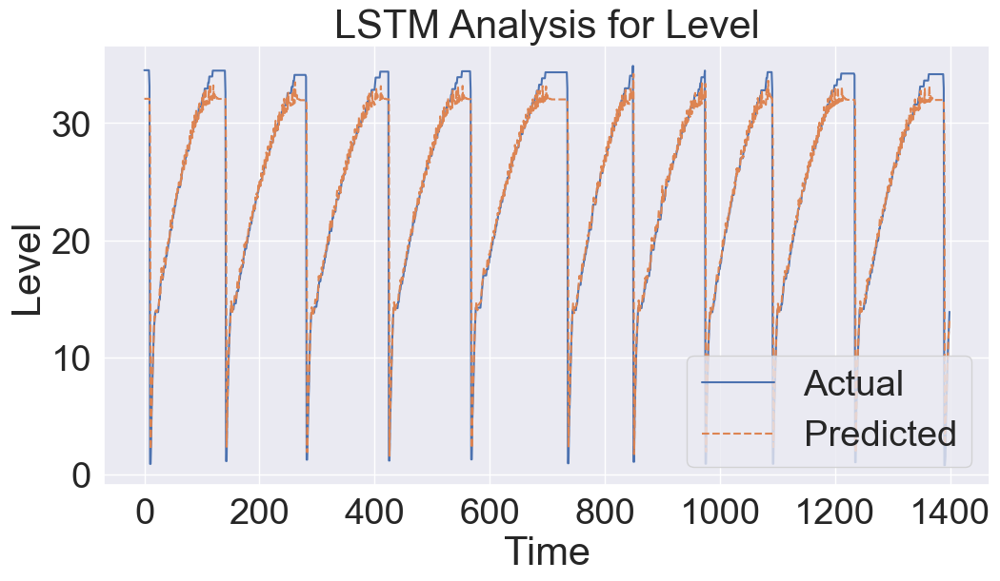

In [20]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Assuming OWPTB is your dataset and 'Level' is the feature you want to predict
data = OWPTB[['Level']].values

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(data)

# Function to create time series data with lookback
def create_dataset(dataset, look_back=1):
    X, y = [], []
    for i in range(len(dataset) - look_back):
        X.append(dataset[i:(i + look_back), 0])
        y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(y)

# Define the lookback window
look_back = 10

# Create the time series dataset
X, y = create_dataset(data_scaled, look_back)

# Reshape the input data for LSTM
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

# Split the data into training and testing sets
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Build the LSTM model
model = Sequential()
model.add(LSTM(units=50, input_shape=(X.shape[1], 1)))
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Make predictions on the test set
y_pred = model.predict(X_test)
y_pred = scaler.inverse_transform(y_pred)
y_test = scaler.inverse_transform(y_test.reshape(-1, 1))

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse:.2f}')

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(y_test[:1400], label='Actual')
plt.plot(y_pred[:1400], label='Predicted', linestyle='dashed')
plt.title('LSTM Analysis for Level')
plt.xlabel('Time')
plt.ylabel('Level')
plt.legend(loc='lower right')
plt.show()

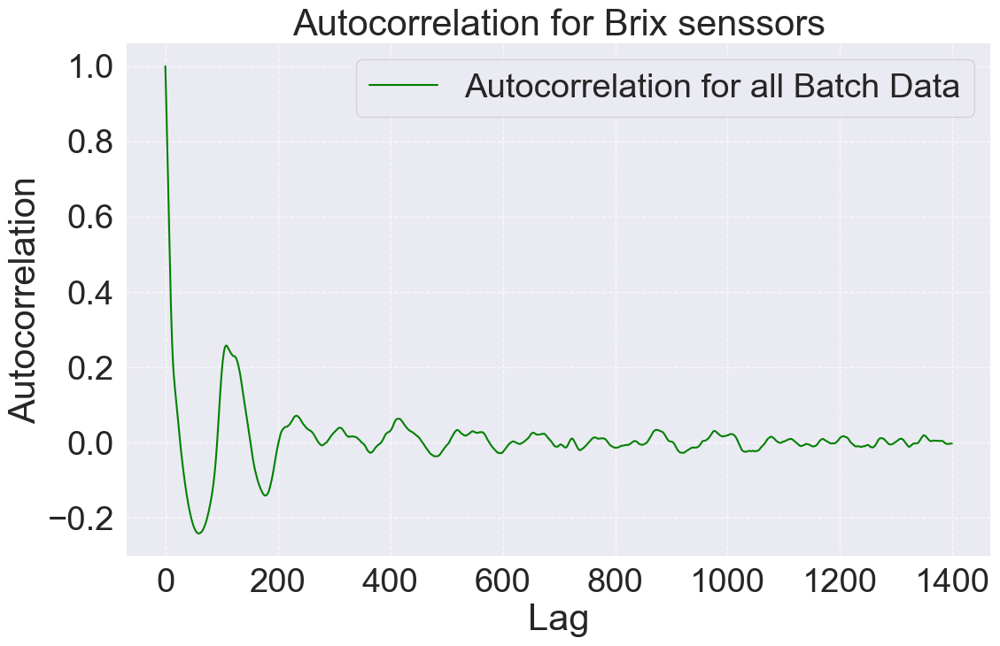

In [21]:
import matplotlib.pyplot as plt
import numpy as np

# Combine all batches into one dataset
combined_data = OWPTB['Brix sensors'].copy()

# Set the maximum lag
max_lag = 1400

# Calculate autocorrelation for the combined dataset
autocorr_values_combined = [combined_data.autocorr(lag=l) for l in range(max_lag)]

# Plot the autocorrelation for the combined dataset
plt.figure(figsize=(12, 8))
plt.plot(np.arange(max_lag), autocorr_values_combined, label='Autocorrelation for all Batch Data', color='green')

plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation for Brix senssors')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# LSTM
    

Epoch 1/10


C:\Users\morebo\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2406/2406 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.0156
Epoch 2/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 0.0039
Epoch 3/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 0.0036
Epoch 4/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 0.0037
Epoch 5/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0035
Epoch 6/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0033
Epoch 7/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.0036
Epoch 8/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 0.0036
Epoch 9/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0035
Epoch 10/10
2406/2406 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - loss: 0.0034
602/602 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Mean Squared Error (MSE): 2.06
Mean Absolute Error (MAE): 0.33
Root Mean Squared Error (RMSE): 1.43
R-squared (R2): 0.90


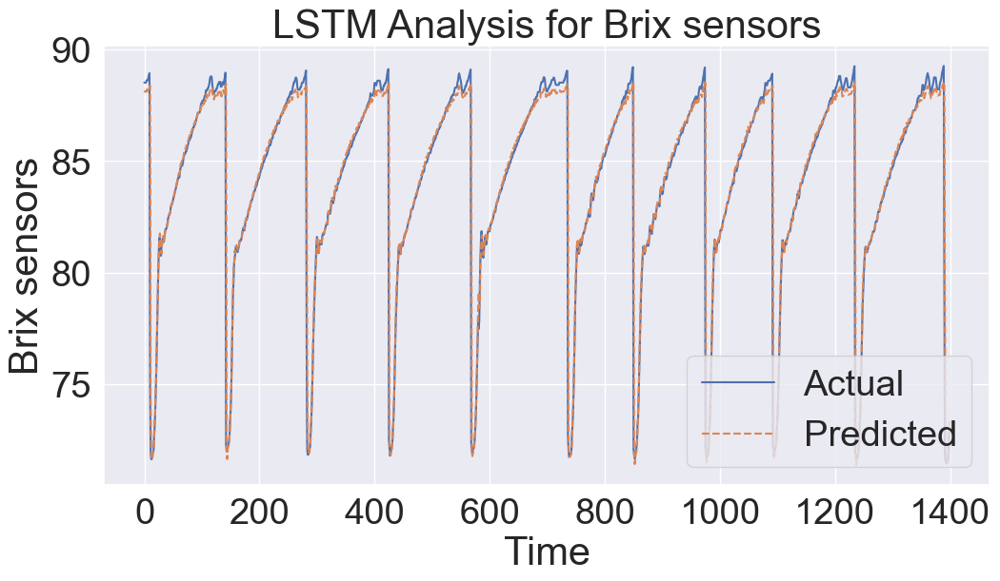

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Assuming OWPTB is your dataset and 'Brix sensors' is the feature you want to predict
data = OWPTB[['Brix sensors']].values

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(data)

# Function to create time series data with lookback
def create_dataset(dataset, look_back=1):
    X, y = [], []
    for i in range(len(dataset) - look_back):
        X.append(dataset[i:(i + look_back), 0])
        y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(y)

# Define the lookback window
look_back = 10

# Create the time series dataset
X, y = create_dataset(data_scaled, look_back)

# Reshape the input data for LSTM
X = np.reshape(X, (X.shape[0], X.shape[1], 1))

# Split the data into training and testing sets
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Build the LSTM model
model = Sequential()
model.add(LSTM(units=50, input_shape=(X.shape[1], 1)))
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Make predictions on the test set
y_pred = model.predict(X_test)
y_pred = scaler.inverse_transform(y_pred)
y_test = scaler.inverse_transform(y_test.reshape(-1, 1))

# Quantitative Evaluation
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
print(f'R-squared (R2): {r2:.2f}')

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(y_test[:1400], label='Actual')
plt.plot(y_pred[:1400], label='Predicted', linestyle='dashed')
plt.title('LSTM Analysis for Brix sensors')
plt.xlabel('Time')
plt.ylabel('Brix sensors')
plt.legend(loc='lower right')
plt.show()



Epoch 1/50


C:\Users\morebo\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4210/4210 ━━━━━━━━━━━━━━━━━━━━ 52s 11ms/step - loss: 0.0253 - val_loss: 0.0038
Epoch 2/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 47s 11ms/step - loss: 0.0061 - val_loss: 0.0022
Epoch 3/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 70s 17ms/step - loss: 0.0046 - val_loss: 0.0018
Epoch 4/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 81s 19ms/step - loss: 0.0042 - val_loss: 0.0017
Epoch 5/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 55s 13ms/step - loss: 0.0039 - val_loss: 0.0017
Epoch 6/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 53s 12ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 7/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 60s 14ms/step - loss: 0.0038 - val_loss: 0.0017
Epoch 8/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 57s 13ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 9/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 53s 13ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 10/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 56s 13ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 11/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 56s 13ms/step - loss: 0.0034 - val_loss: 0.0017
Epoch 12/50
4210/42

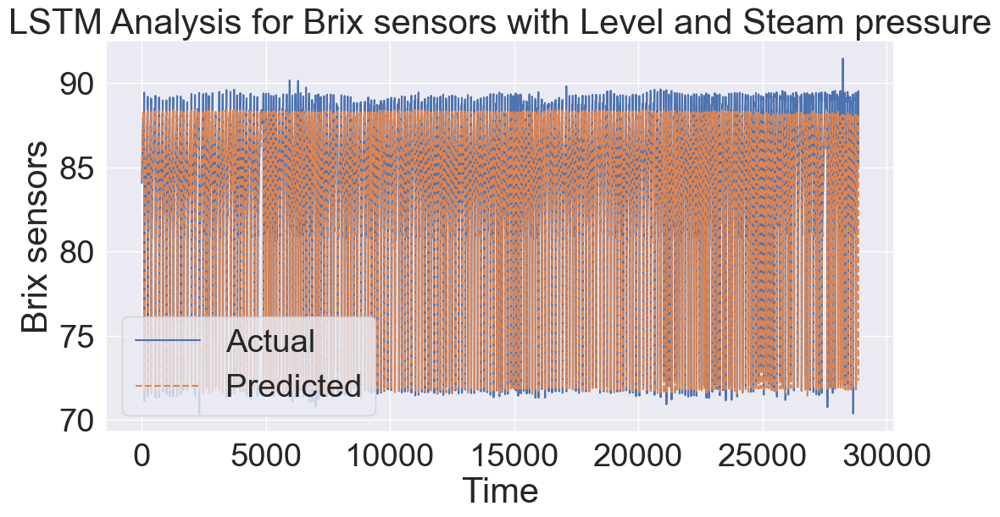

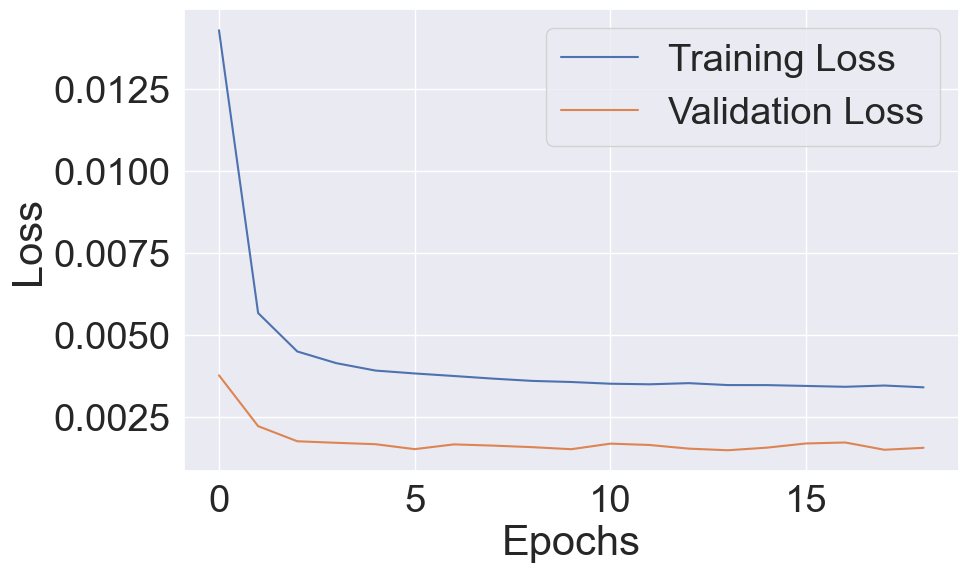

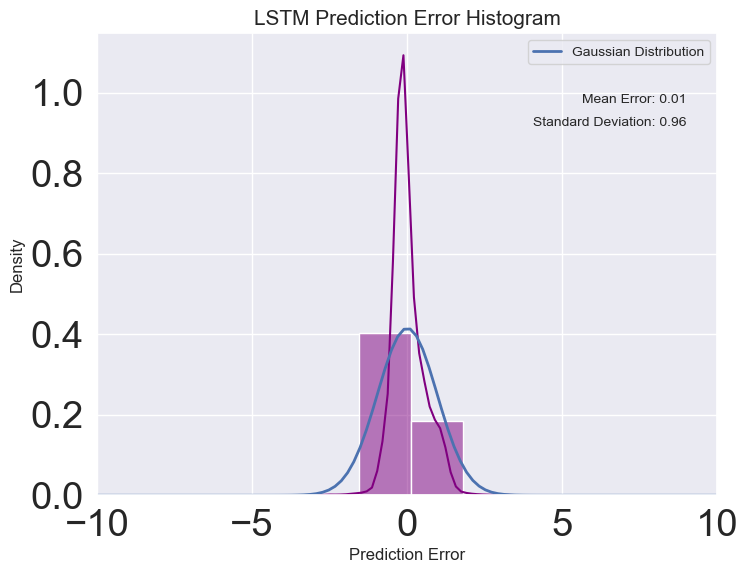

In [21]:
#Based on Level and Steam pressure
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from scipy.stats import norm
import seaborn as sns

# Assuming OWPTB is your dataset
# Extract the relevant features
data = OWPTB[['Brix sensors', 'Level', 'Steam pressure']]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(data)

# Function to create time series data with lookback
def create_dataset(dataset, look_back=1):
    X, y = [], []
    for i in range(len(dataset) - look_back):
        X.append(dataset[i:(i + look_back), 1:])  # Features from index 1 onwards
        y.append(dataset[i + look_back, 0])  # Target 'Brix sensors'
    return np.array(X), np.array(y)

# Define the lookback window
look_back = 10

# Create the time series dataset
X, y = create_dataset(data_scaled, look_back)

# Reshape the input data for LSTM
# X = np.reshape(X, (X.shape[0], X.shape[1], X.shape[2]))

# Split the data into training and testing sets
train_size = int(len(X) * 0.7)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Build the LSTM model with added complexity and regularization
model = Sequential()
model.add(LSTM(units=16, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model.add(Dropout(0.2))  # Dropout layer to prevent overfitting
model.add(LSTM(units=16, return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=16))
model.add(Dropout(0.2))
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mean_squared_error')


# Train the model with early stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test), callbacks=[early_stop])

# Make predictions on the test set
y_pred = model.predict(X_test).reshape(-1)
y_pred_3d = np.zeros(shape=(y_pred.shape[0], 3))
y_pred_3d[:, 0] = y_pred.copy()
y_pred = y_pred_3d
y_pred = scaler.inverse_transform(y_pred)[:, 0]

y_test_3d = np.zeros(shape=(y_test.shape[0], 3))
y_test_3d[:, 0] = y_test.copy()
y_test= y_test_3d
y_test = scaler.inverse_transform(y_test)[:, 0]

# Quantitative Evaluation
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
print(f'R-squared (R2): {r2:.2f}')
print(f'MAPE: {mape:.2f}')


# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted', linestyle='dashed')
plt.title('LSTM Analysis for Brix sensors with Level and Steam pressure')
plt.xlabel('Time')
plt.ylabel('Brix sensors')
plt.legend()
plt.show()

# Plot training loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Calculate prediction error
error_lstm = y_test.flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_lstm, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_lstm = np.mean(error_lstm)
std_error_lstm = np.std(error_lstm)

# Generate values for Gaussian curve
x = np.linspace(-10, 10, 100)
pdf = norm.pdf(x, mean_error_lstm, std_error_lstm)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x, pdf, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_lstm:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_lstm:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('LSTM Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()

Epoch 1/50


C:\Users\morebo\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4210/4210 ━━━━━━━━━━━━━━━━━━━━ 37s 8ms/step - loss: 0.0203 - val_loss: 0.0032
Epoch 2/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 37s 9ms/step - loss: 0.0044 - val_loss: 0.0022
Epoch 3/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 41s 10ms/step - loss: 0.0035 - val_loss: 0.0017
Epoch 4/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 44s 10ms/step - loss: 0.0030 - val_loss: 0.0019
Epoch 5/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 45s 11ms/step - loss: 0.0027 - val_loss: 0.0014
Epoch 6/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 48s 11ms/step - loss: 0.0024 - val_loss: 0.0014
Epoch 7/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 42s 10ms/step - loss: 0.0024 - val_loss: 0.0015
Epoch 8/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 46s 11ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 9/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 41s 10ms/step - loss: 0.0021 - val_loss: 0.0015
Epoch 10/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 43s 10ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 11/50
4210/4210 ━━━━━━━━━━━━━━━━━━━━ 45s 11ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 12/50
4210/4210

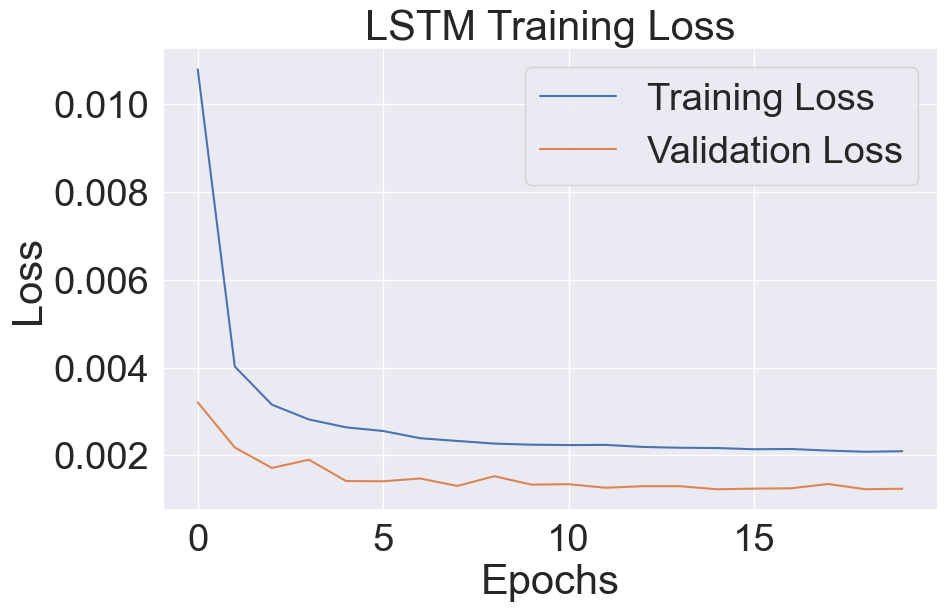

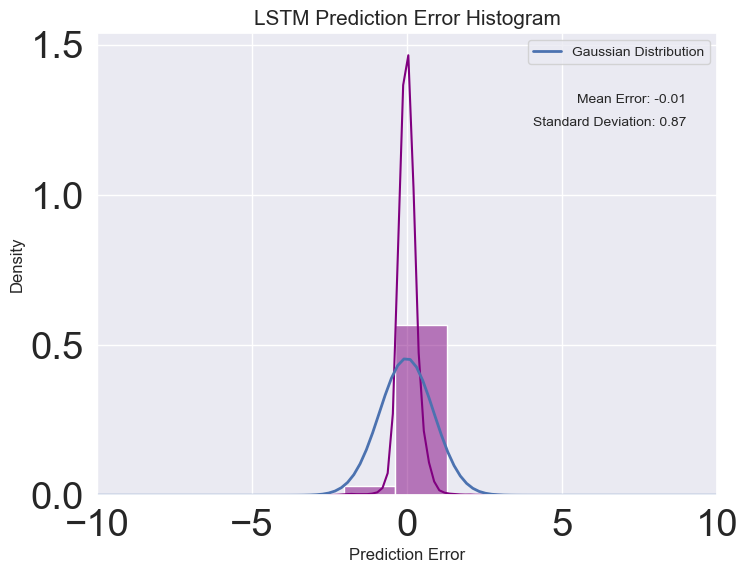

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from scipy.stats import norm
import seaborn as sns

# Assuming OWPTB is your dataset
# Extract the relevant features
data = OWPTB[['Brix sensors', 'Level', 'Steam pressure', 'Vacuum pressure']]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(data)

# Define the lookback window
look_back = 10

# Function to create time series data with lookback
def create_dataset(dataset, look_back=1):
    X, y = [], []
    for i in range(len(dataset) - look_back):
        X.append(dataset[i:(i + look_back), :])  # All features
        y.append(dataset[i + look_back, 0])  # Target 'Brix sensors'
    return np.array(X), np.array(y)

# Create the time series dataset
X, y = create_dataset(data_scaled, look_back)

# Split the data into training and testing sets
train_size = int(len(X) * 0.7)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Build the LSTM model
model_lstm = Sequential()
model_lstm.add(LSTM(units=16, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model_lstm.add(Dropout(0.2))
model_lstm.add(LSTM(units=16, return_sequences=True))
model_lstm.add(Dropout(0.2))
model_lstm.add(LSTM(units=16))
model_lstm.add(Dropout(0.2))
model_lstm.add(Dense(units=1))
model_lstm.compile(optimizer='adam', loss='mean_squared_error')

# Train the LSTM model with early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

history_lstm = model_lstm.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test), callbacks=[early_stop])

# Make predictions on the test set
y_pred_lstm = model_lstm.predict(X_test)

# Inverse transform y_pred_lstm
y_pred_lstm = scaler.inverse_transform(np.concatenate((y_pred_lstm, X_test[:, -1, 1:]), axis=1))[:, 0]

# Inverse transform y_test_lstm
y_test_lstm = scaler.inverse_transform(np.concatenate((y_test.reshape(-1, 1), X_test[:, -1, 1:]), axis=1))[:, 0]

# Quantitative Evaluation for LSTM
mse_lstm = mean_squared_error(y_test_lstm, y_pred_lstm)
mae_lstm = mean_absolute_error(y_test_lstm, y_pred_lstm)
rmse_lstm = np.sqrt(mse_lstm)
r2_lstm = r2_score(y_test_lstm, y_pred_lstm)
mape_lstm = np.mean(np.abs((y_test_lstm - y_pred_lstm) / y_test_lstm)) * 100

print(f'LSTM Model Metrics:')
print(f'Mean Squared Error (MSE): {mse_lstm:.2f}')
print(f'Mean Absolute Error (MAE): {mae_lstm:.2f}')
print(f'Root Mean Squared Error (RMSE): {rmse_lstm:.2f}')
print(f'R-squared (R2): {r2_lstm:.2f}')
print(f'MAPE: {mape_lstm:.2f}')

# Plot training loss for LSTM
plt.figure(figsize=(10, 6))
plt.plot(history_lstm.history['loss'], label='Training Loss')
plt.plot(history_lstm.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('LSTM Training Loss')
plt.show()

# Calculate prediction error for LSTM
error_lstm = y_test_lstm - y_pred_lstm

# Plotting the histogram for LSTM prediction error
plt.figure(figsize=(8, 6))
sns.histplot(error_lstm, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error for LSTM
mean_error_lstm = np.mean(error_lstm)
std_error_lstm = np.std(error_lstm)

# Generate values for Gaussian curve
x = np.linspace(-10, 10, 100)
pdf = norm.pdf(x, mean_error_lstm, std_error_lstm)  # Gaussian distribution

# Plot Gaussian distribution curve for LSTM
plt.plot(x, pdf, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation for LSTM
plt.text(0.95, 0.85, f'Mean Error: {mean_error_lstm:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_lstm:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('LSTM Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()


Epoch 1/50
1053/1053 [==============================] - 38s 30ms/step - loss: 0.0248 - val_loss: 0.0072
Epoch 2/50
1053/1053 [==============================] - 32s 30ms/step - loss: 0.0132 - val_loss: 0.0050
Epoch 3/50
1053/1053 [==============================] - 30s 29ms/step - loss: 0.0104 - val_loss: 0.0053
Epoch 4/50
1053/1053 [==============================] - 30s 29ms/step - loss: 0.0090 - val_loss: 0.0039
Epoch 5/50
1053/1053 [==============================] - 29s 28ms/step - loss: 0.0082 - val_loss: 0.0035
Epoch 6/50
1053/1053 [==============================] - 31s 29ms/step - loss: 0.0077 - val_loss: 0.0036
Epoch 7/50
1053/1053 [==============================] - 30s 28ms/step - loss: 0.0075 - val_loss: 0.0032
Epoch 8/50
1053/1053 [==============================] - 29s 28ms/step - loss: 0.0072 - val_loss: 0.0030
Epoch 9/50
1053/1053 [==============================] - 33s 31ms/step - loss: 0.0070 - val_loss: 0.0032
Epoch 10/50
1053/1053 [==============================] - 36s 34m

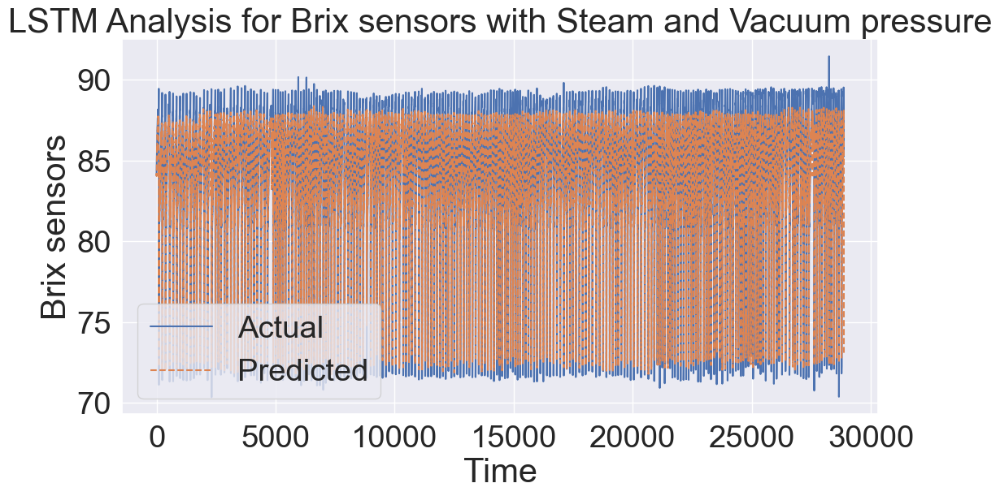

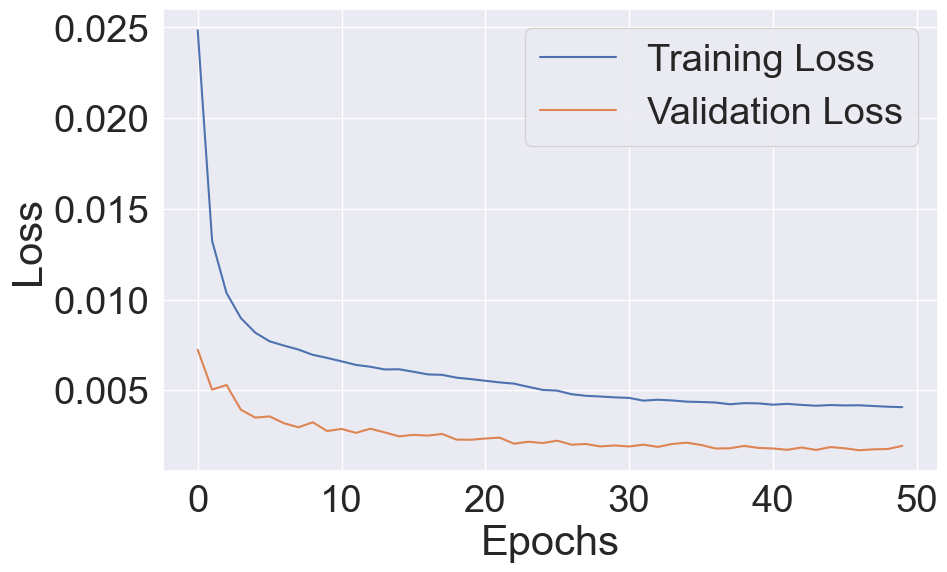

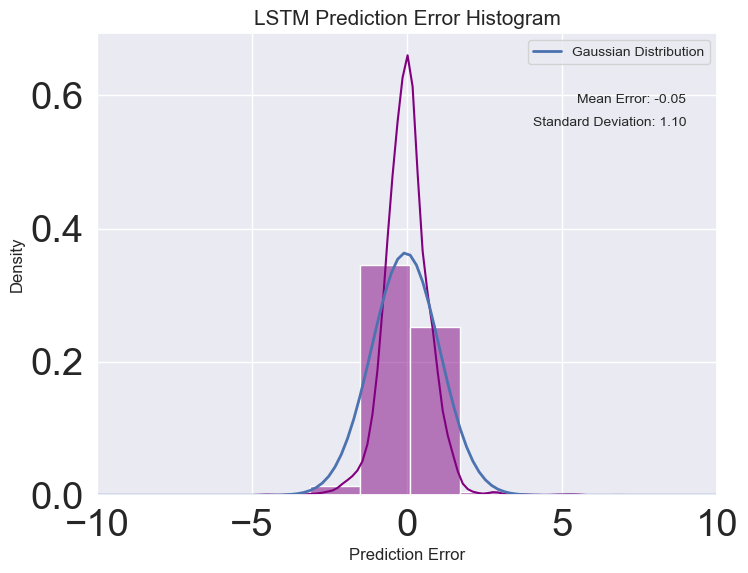

In [55]:
#Based on Steam pressure and Vacuum pressure
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from scipy.stats import norm
import seaborn as sns

# Assuming OWPTB is your dataset
# Extract the relevant features
data = OWPTB[['Brix sensors', 'Steam pressure', 'Vacuum pressure']]

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(data)

# Function to create time series data with lookback
def create_dataset(dataset, look_back=1):
    X, y = [], []
    for i in range(len(dataset) - look_back):
        X.append(dataset[i:(i + look_back), 1:])  # Features from index 1 onwards
        y.append(dataset[i + look_back, 0])  # Target 'Brix sensors'
    return np.array(X), np.array(y)

# Define the lookback window
look_back = 10

# Create the time series dataset
X, y = create_dataset(data_scaled, look_back)

# Reshape the input data for LSTM
# X = np.reshape(X, (X.shape[0], X.shape[1], X.shape[2]))

# Split the data into training and testing sets
train_size = int(len(X) * 0.7)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Build the LSTM model with added complexity and regularization
model = Sequential()
model.add(LSTM(units=16, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model.add(Dropout(0.2))  # Dropout layer to prevent overfitting
model.add(LSTM(units=16, return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=16))
model.add(Dropout(0.2))
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mean_squared_error')


# Train the model with early stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

history = model.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_test, y_test), callbacks=[early_stop])

# Make predictions on the test set
y_pred = model.predict(X_test).reshape(-1)
y_pred_3d = np.zeros(shape=(y_pred.shape[0], 3))
y_pred_3d[:, 0] = y_pred.copy()
y_pred = y_pred_3d
y_pred = scaler.inverse_transform(y_pred)[:, 0]

y_test_3d = np.zeros(shape=(y_test.shape[0], 3))
y_test_3d[:, 0] = y_test.copy()
y_test= y_test_3d
y_test = scaler.inverse_transform(y_test)[:, 0]

# Quantitative Evaluation
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
print(f'R-squared (R2): {r2:.2f}')
print(f'MAPE: {mape:.2f}')


# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted', linestyle='dashed')
plt.title('LSTM Analysis for Brix sensors with Steam and Vacuum pressure')
plt.xlabel('Time')
plt.ylabel('Brix sensors')
plt.legend()
plt.show()

# Plot training loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Calculate prediction error
error_lstm = y_test.flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_lstm, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_lstm = np.mean(error_lstm)
std_error_lstm = np.std(error_lstm)

# Generate values for Gaussian curve
x = np.linspace(-10, 10, 100)
pdf = norm.pdf(x, mean_error_lstm, std_error_lstm)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x, pdf, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_lstm:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_lstm:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('LSTM Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()

# MLR

NameError: name 'np' is not defined

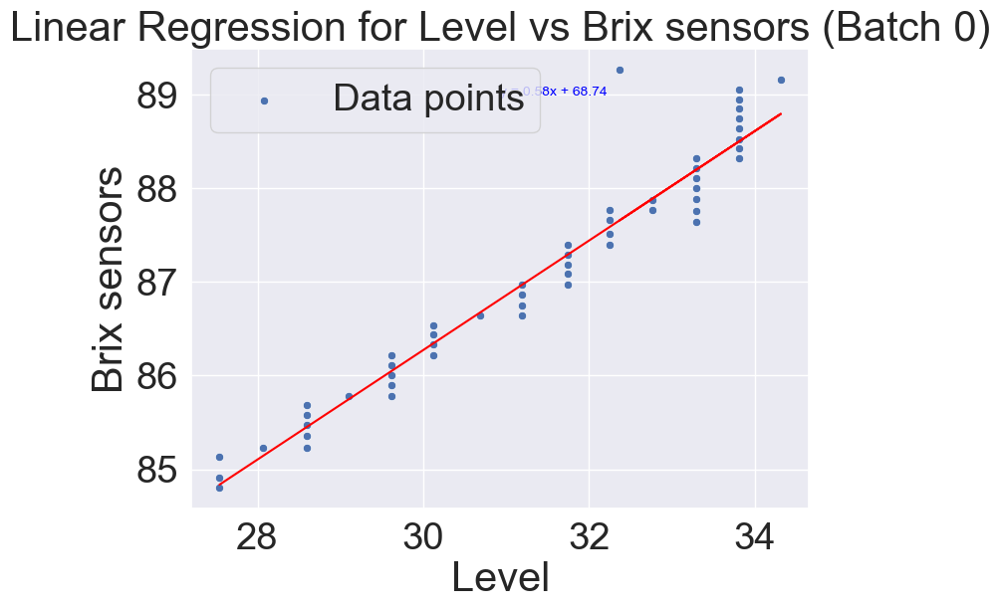

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Filter data for Batch=0
batch_data = OWPTB[OWPTB['Batch'] == 0]

# Extract 'Level' and 'Brix sensors' columns
level_data = batch_data['Level']
brix_data = batch_data['Brix sensors']

# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(level_data, brix_data)

# Plot the data points and regression line
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Level', y='Brix sensors', data=batch_data, label='Data points')
plt.plot(level_data, slope * level_data + intercept, color='red', label='Linear Regression')

# Set labels and title
plt.xlabel('Level')
plt.ylabel('Brix sensors')
plt.title('Linear Regression for Level vs Brix sensors (Batch 0)')

# Display the regression equation
equation = f'y = {slope:.2f}x + {intercept:.2f}'
plt.text(0.5, 0.9, equation, transform=plt.gca().transAxes, fontsize=10, color='blue')


# Predict Brix sensors values using the linear regression model
predicted_brix = slope * level_data + intercept

# Calculate RSE
rse = np.sqrt(sum((brix_data - predicted_brix) ** 2) / (len(brix_data) - 2))

# Calculate MSE
mse = mean_squared_error(brix_data, predicted_brix)

# Calculate R^2
r2 = r2_score(brix_data, predicted_brix)

# Calculate MAE
mae = mean_absolute_error(brix_data, predicted_brix)

# Display the results
print(f"RSE: {rse:.2f}")
print(f"MSE: {mse:.2f}")
print(f"R^2: {r2:.2f}")
print(f"MAE: {mae:.2f}")



# Show the legend
plt.legend()

# Show the plot
plt.show()


Validation MAPE: 1.25%
Validation MSE: 2.83
Validation R^2: 0.87
Validation MAE: 1.01


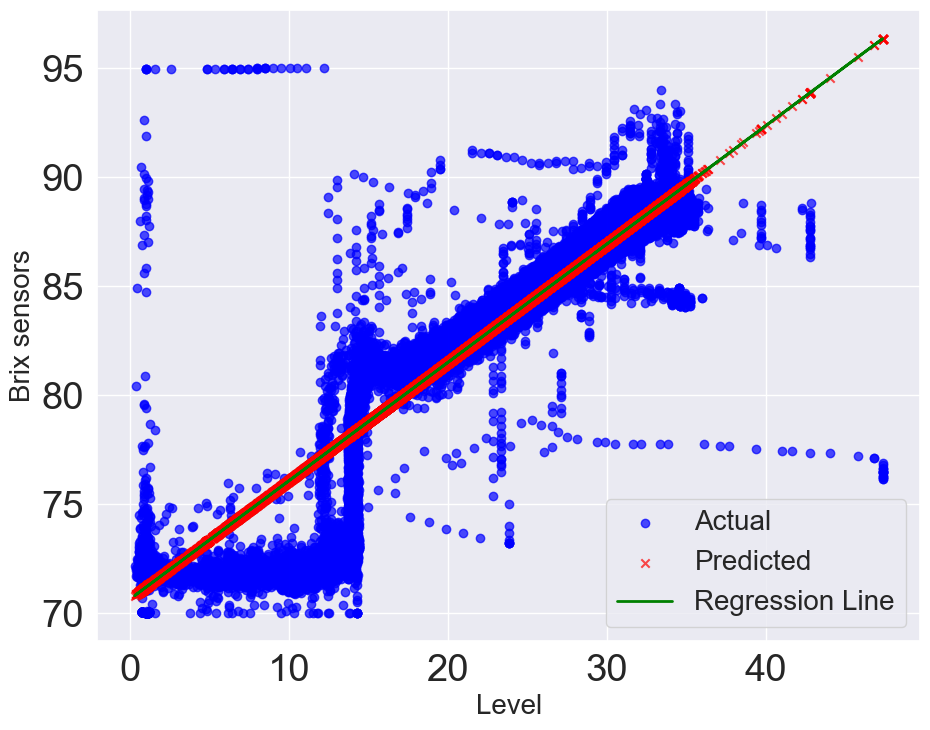

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from scipy.stats import linregress
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Define the features (independent variable) and target (dependent variable)
X = OWPTB[['Level']]
y = OWPTB['Brix sensors']

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.6, random_state=42)

# Perform linear regression on the training set
slope, intercept, _, _, _ = linregress(X_train['Level'], y_train)

# Predict Brix sensors values on the validation set
predicted_brix_val = slope * X_val['Level'] + intercept

# Calculate evaluation metrics on the validation set
rse_val = np.sqrt(sum((y_val - predicted_brix_val) ** 2) / (len(y_val) - 2))
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

# Plot actual vs predicted values on the validation set
plt.figure(figsize=(10, 8))

# Plot actual values
plt.scatter(X_val['Level'], y_val, label='Actual', marker='o', color='blue', alpha=0.7)

# Plot predicted values
plt.scatter(X_val['Level'], predicted_brix_val, label='Predicted', marker='x', color='red', alpha=0.7)

# Plot regression line
plt.plot(X_val['Level'], slope * X_val['Level'] + intercept, color='green', linewidth=2, label='Regression Line')

plt.xlabel('Level',fontsize=20)
plt.ylabel('Brix sensors',fontsize=20)
plt.legend(fontsize=20)
plt.grid(True)
plt.tight_layout()

# Save the plot as an image
plt.savefig('linear_regression_plot.png')

# Show the plot
plt.show()


Validation MAPE: 1.19%
Validation MSE: 2.74
Validation R^2: 0.87
Validation MAE: 0.96


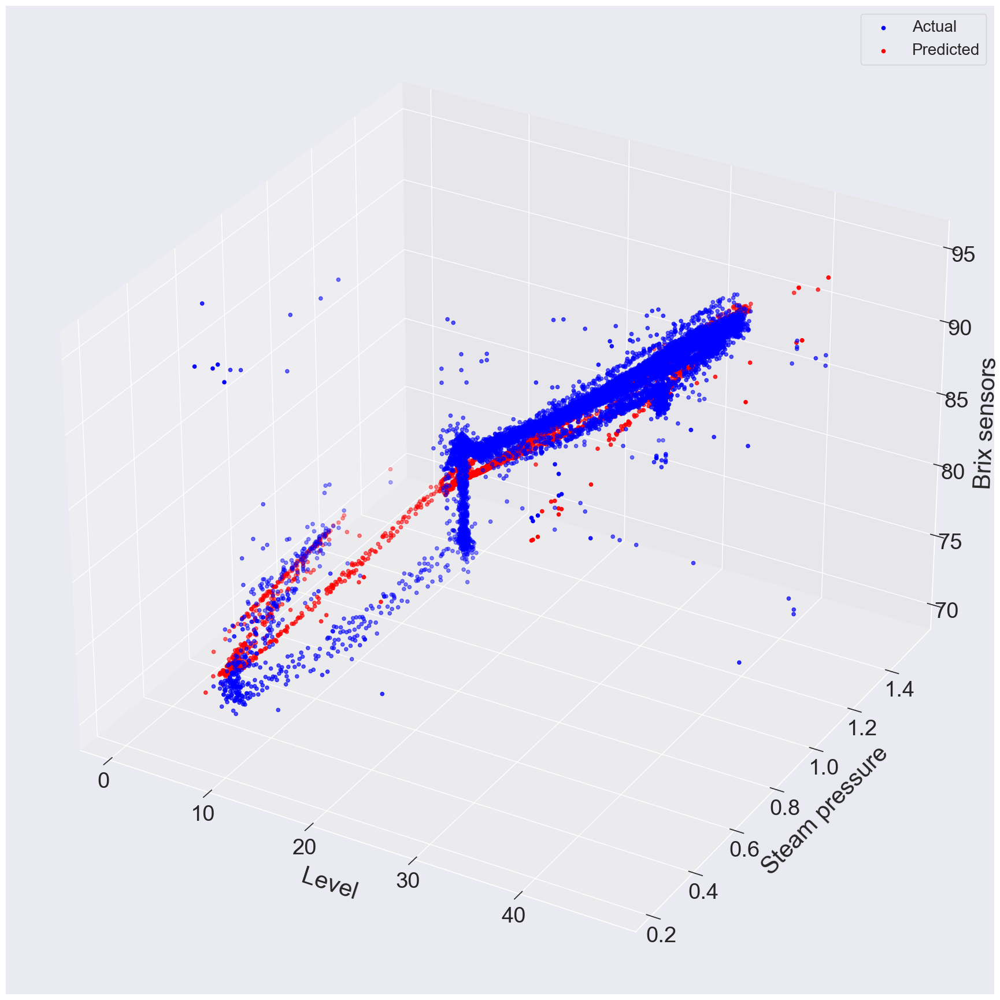

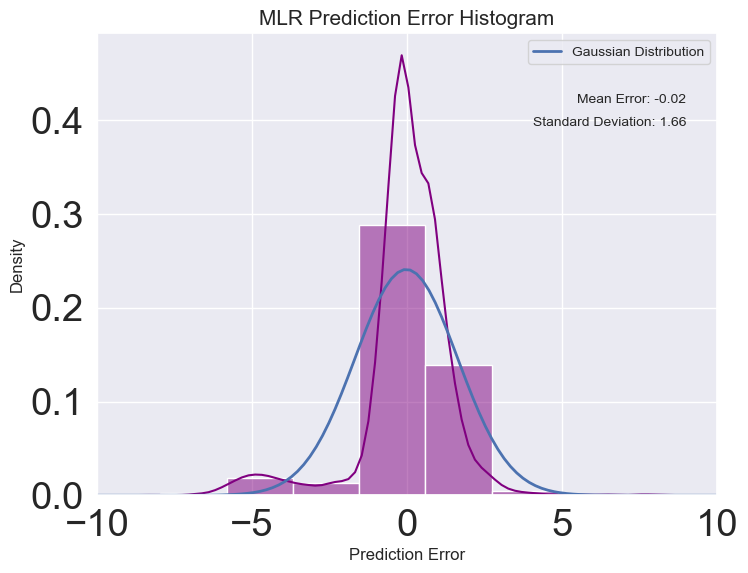

In [27]:
#MLR based on level and steam presuure
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Level', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model on the training set
model.fit(X_train, y_train)

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate evaluation metrics on the validation set
rse_val = np.sqrt(sum((y_val - predicted_brix_val) ** 2) / (len(y_val) - 2))
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

from mpl_toolkits.mplot3d import Axes3D


# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], y_val, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], predicted_brix_val, c='red', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=20)
plt.show()
# Calculate prediction error for MLR
error_mlr = y_val.values.flatten() - predicted_brix_val.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_mlr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_mlr = np.mean(error_mlr)
std_error_mlr = np.std(error_mlr)

# Generate values for Gaussian curve
x_mlr = np.linspace(-10, 10, 100)
pdf_mlr = norm.pdf(x_mlr, mean_error_mlr, std_error_mlr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_mlr, pdf_mlr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('MLR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()



Validation MAPE: 1.18%
Validation MSE: 2.64
Validation R^2: 0.87
Validation MAE: 0.95


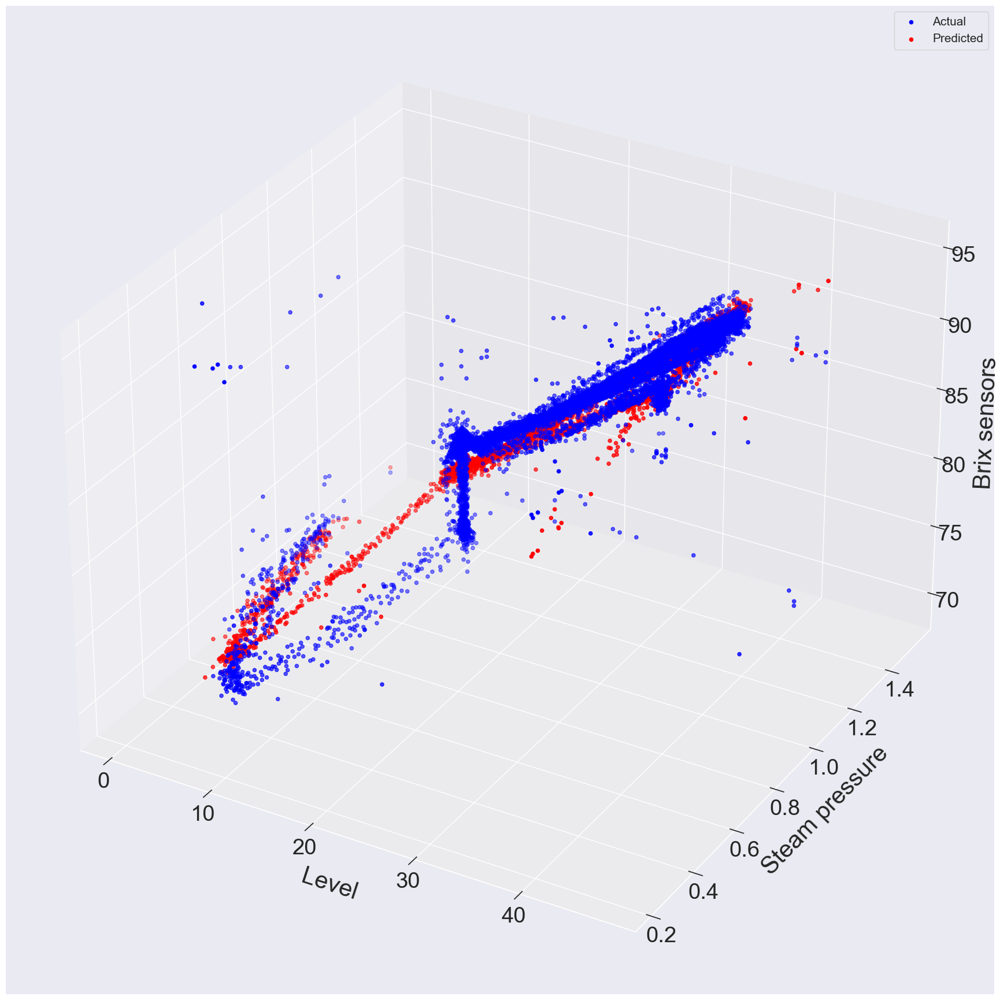

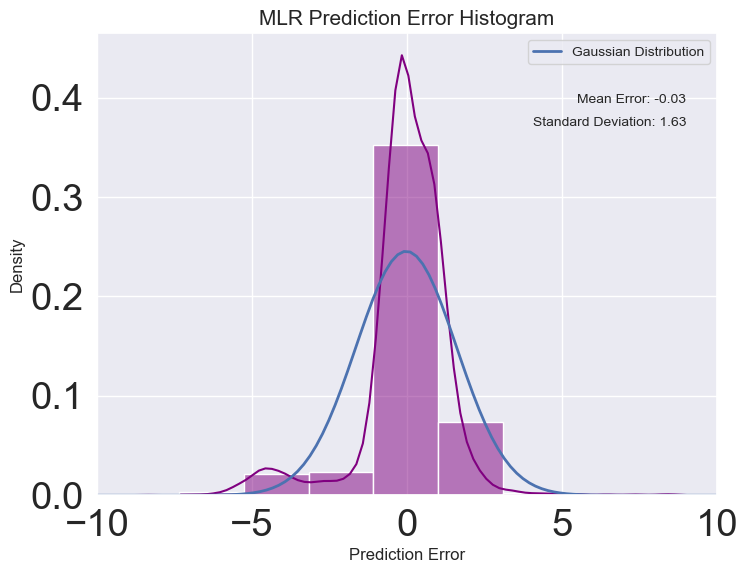

In [70]:
#MLR based on Level, vacuum pressure and steam presuure
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Level','Vacuum pressure', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model on the training set
model.fit(X_train, y_train)

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate evaluation metrics on the validation set
rse_val = np.sqrt(sum((y_val - predicted_brix_val) ** 2) / (len(y_val) - 2))
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

from mpl_toolkits.mplot3d import Axes3D


# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], y_val, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], predicted_brix_val, c='red', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=15)
plt.show()
# Calculate prediction error for MLR
error_mlr = y_val.values.flatten() - predicted_brix_val.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_mlr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_mlr = np.mean(error_mlr)
std_error_mlr = np.std(error_mlr)

# Generate values for Gaussian curve
x_mlr = np.linspace(-10, 10, 100)
pdf_mlr = norm.pdf(x_mlr, mean_error_mlr, std_error_mlr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_mlr, pdf_mlr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('MLR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()



Validation MAPE: 2.00%
Validation MSE: 7.23
Validation R^2: 0.65
Validation MAE: 1.64


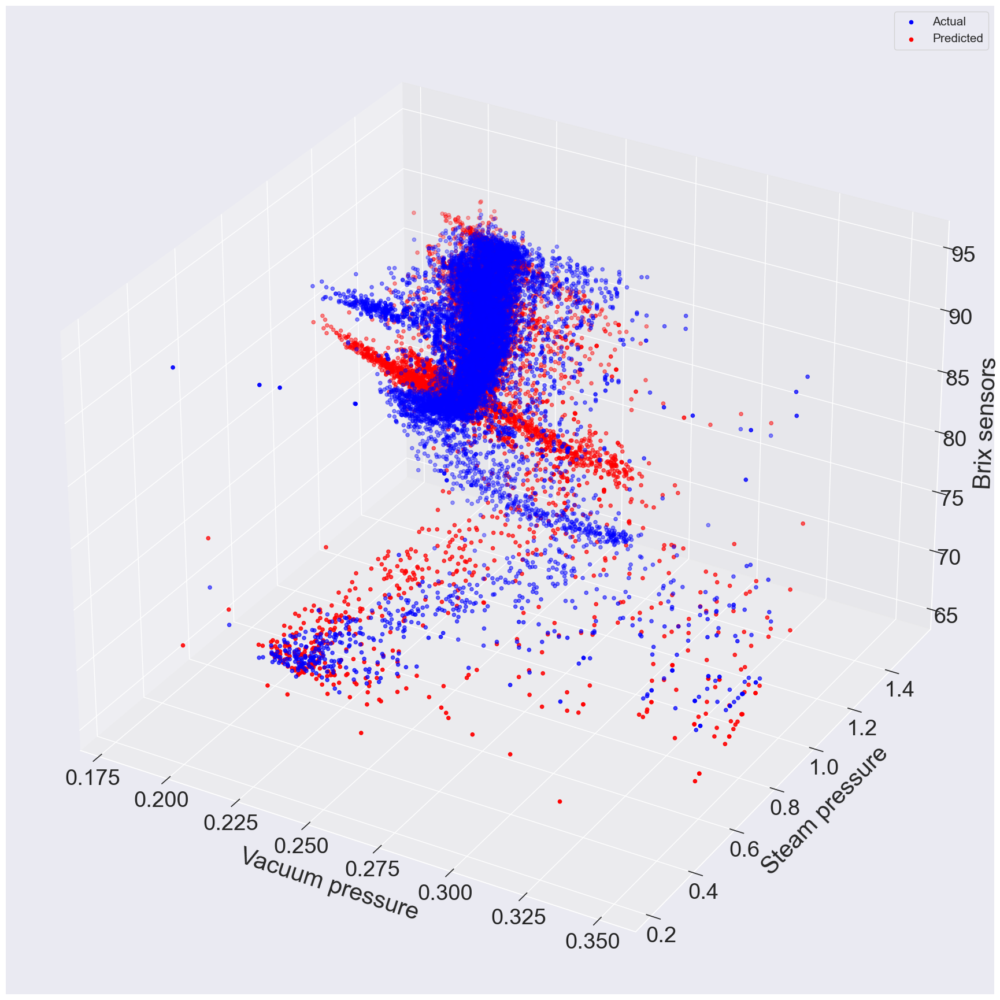

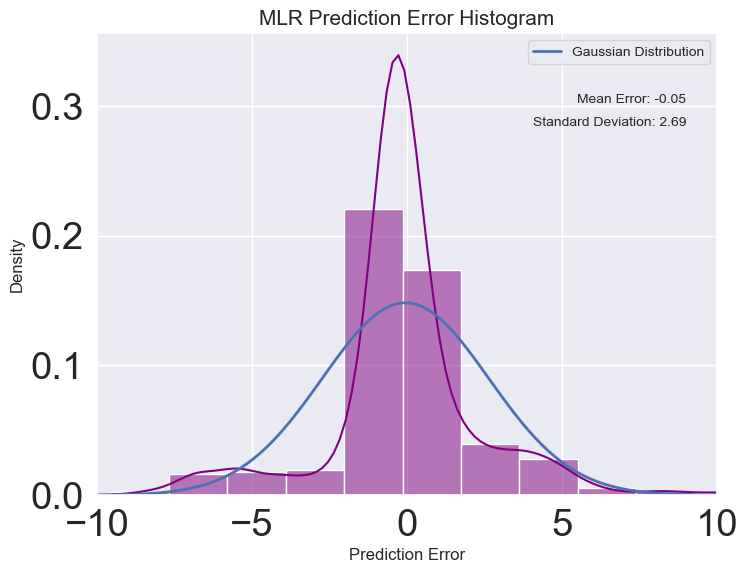

In [71]:
#MLR based on vacuum pressure and steam presuure
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Vacuum pressure', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model on the training set
model.fit(X_train, y_train)

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate evaluation metrics on the validation set
rse_val = np.sqrt(sum((y_val - predicted_brix_val) ** 2) / (len(y_val) - 2))
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

from mpl_toolkits.mplot3d import Axes3D


# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_val['Vacuum pressure'], X_val['Steam pressure'], y_val, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_val['Vacuum pressure'], X_val['Steam pressure'], predicted_brix_val, c='red', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Vacuum pressure',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=15)
plt.show()
# Calculate prediction error for MLR
error_mlr = y_val.values.flatten() - predicted_brix_val.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_mlr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_mlr = np.mean(error_mlr)
std_error_mlr = np.std(error_mlr)

# Generate values for Gaussian curve
x_mlr = np.linspace(-10, 10, 100)
pdf_mlr = norm.pdf(x_mlr, mean_error_mlr, std_error_mlr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_mlr, pdf_mlr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_mlr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('MLR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()



                            OLS Regression Results                            
Dep. Variable:           Brix sensors   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                 1.364e+05
Date:                Tue, 21 May 2024   Prob (F-statistic):               0.00
Time:                        11:29:50   Log-Likelihood:            -1.0941e+05
No. Observations:               57742   AIC:                         2.188e+05
Df Residuals:                   57738   BIC:                         2.189e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              73.1404      0.121    6

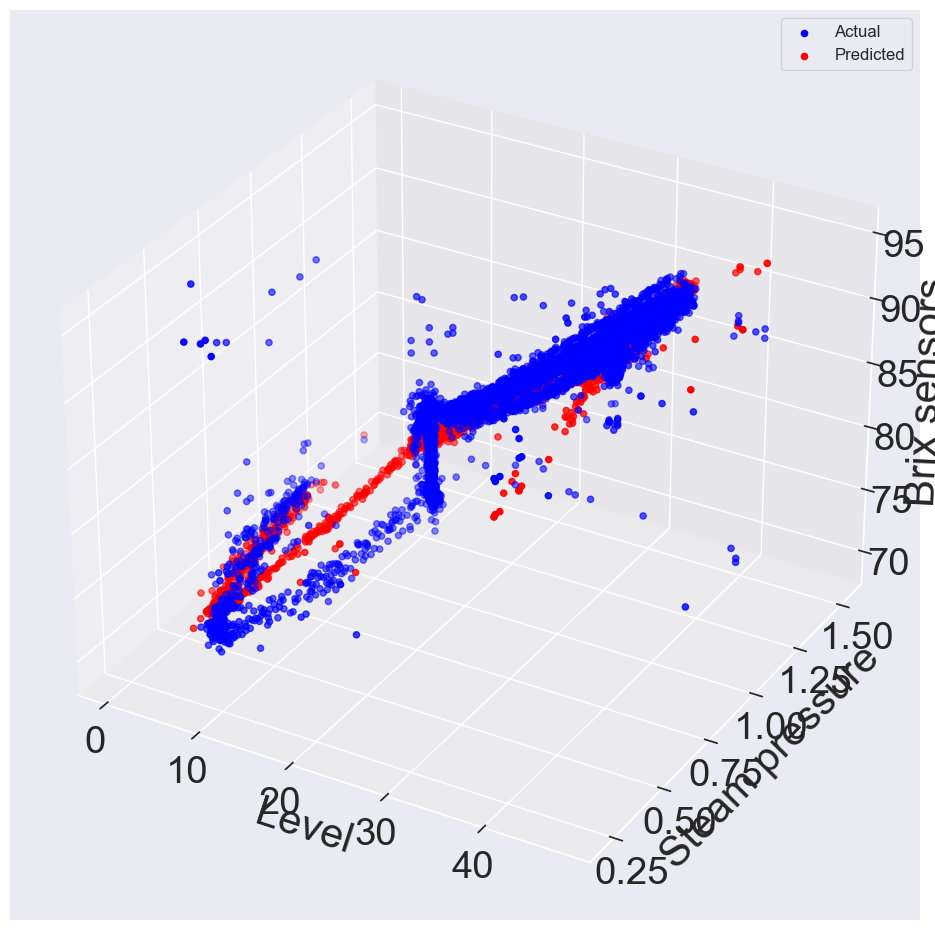

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Level', 'Steam pressure','Vacuum pressure']]
y = OWPTB['Brix sensors']

# Add constant for intercept
X = sm.add_constant(X)

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Fit the linear regression model
model = sm.OLS(y_train, X_train).fit()

# Get model summary
print(model.summary())

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate evaluation metrics on the validation set
mse_val = mean_squared_error(y_val, predicted_brix_val)
r2_val = r2_score(y_val, predicted_brix_val)
mae_val = mean_absolute_error(y_val, predicted_brix_val)
mape_val = np.mean(np.abs((y_val - predicted_brix_val) / y_val)) * 100

# Display the evaluation results
print(f"Validation MAPE: {mape_val:.2f}%")
print(f"Validation MSE: {mse_val:.2f}")
print(f"Validation R^2: {r2_val:.2f}")
print(f"Validation MAE: {mae_val:.2f}")

# Get the confidence intervals for the coefficients
conf_int = model.conf_int()

# Calculate the prediction interval manually based on residuals
residuals = y_val - predicted_brix_val
std_err = np.sqrt(np.sum(residuals ** 2) / (len(X_val) - 2))
t_value = 1.96  # 95% confidence interval
pred_interval = t_value * std_err

# Display confidence intervals and prediction interval
print("\nConfidence Intervals for Coefficients:")
print(conf_int)
print(f"\nPrediction Interval: ±{pred_interval:.2f}")

# Create a 3D plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], y_val, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_val['Level'], X_val['Steam pressure'], predicted_brix_val, c='red', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level', labelpad=5)
ax.set_ylabel('Steam pressure', labelpad=5)
ax.set_zlabel('Brix sensors', labelpad=5)
fig.tight_layout()

# Show the plot
plt.legend(fontsize=12)
plt.show()



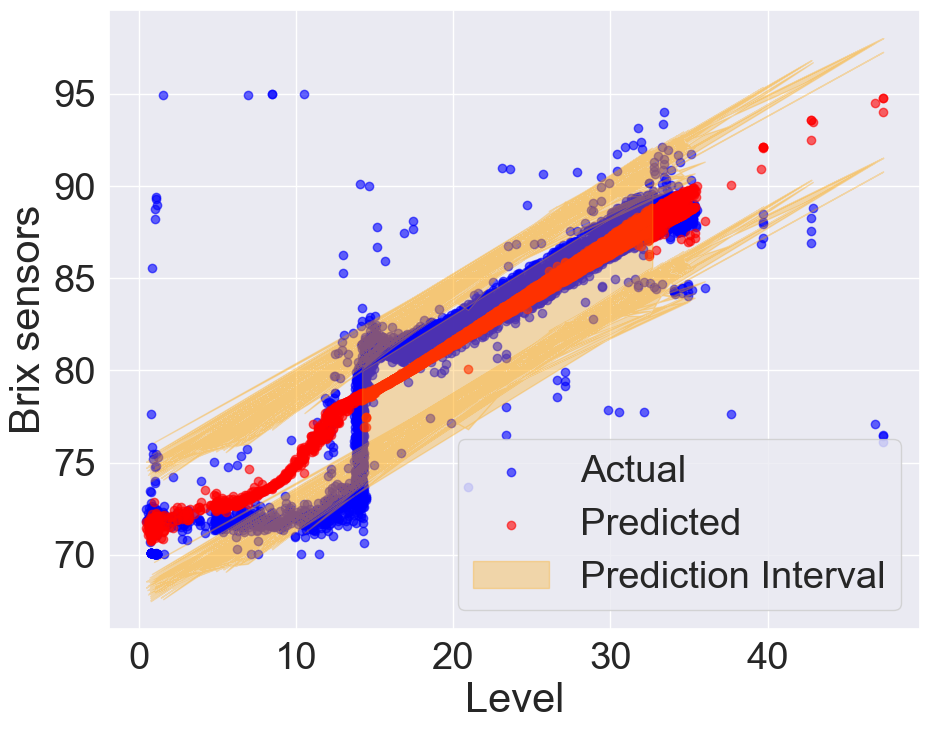

In [98]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

# Define the features (independent variables) and target (dependent variable)
X = OWPTB[['Level', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Add constant for intercept
X = sm.add_constant(X)

# Split the data into training (60%), testing (30%), and validation (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Fit the linear regression model
model = sm.OLS(y_train, X_train).fit()

# Predict Brix sensors values on the validation set
predicted_brix_val = model.predict(X_val)

# Calculate the prediction interval
residuals = y_val - predicted_brix_val
std_err = np.sqrt(np.sum(residuals ** 2) / (len(X_val) - 2))
t_value = 1.96  # 95% confidence interval
pred_interval = t_value * std_err

# Plotting Brix sensors vs Level with prediction interval
plt.figure(figsize=(10, 8))

# Scatter plot for actual Brix sensors
plt.scatter(X_val['Level'], y_val, color='blue', label='Actual', alpha=0.6)

# Scatter plot for predicted Brix sensors
plt.scatter(X_val['Level'], predicted_brix_val, color='red', label='Predicted', alpha=0.6)

# Plot prediction interval
plt.fill_between(X_val['Level'], predicted_brix_val - pred_interval, predicted_brix_val + pred_interval, color='orange', alpha=0.3, label='Prediction Interval')

# Add labels and title
plt.xlabel('Level')
plt.ylabel('Brix sensors')
plt.legend()

# Show plot
plt.grid(True)
plt.tight_layout()
plt.show()


# NN

1805/1805 [==============================] - 4s 2ms/step
Mean Absolute Percentage Error (MAPE): 0.84%
Mean Squared Error (MSE): 1.58
R-squared (R2): 0.92
Mean Absolute Error (MAE): 0.70


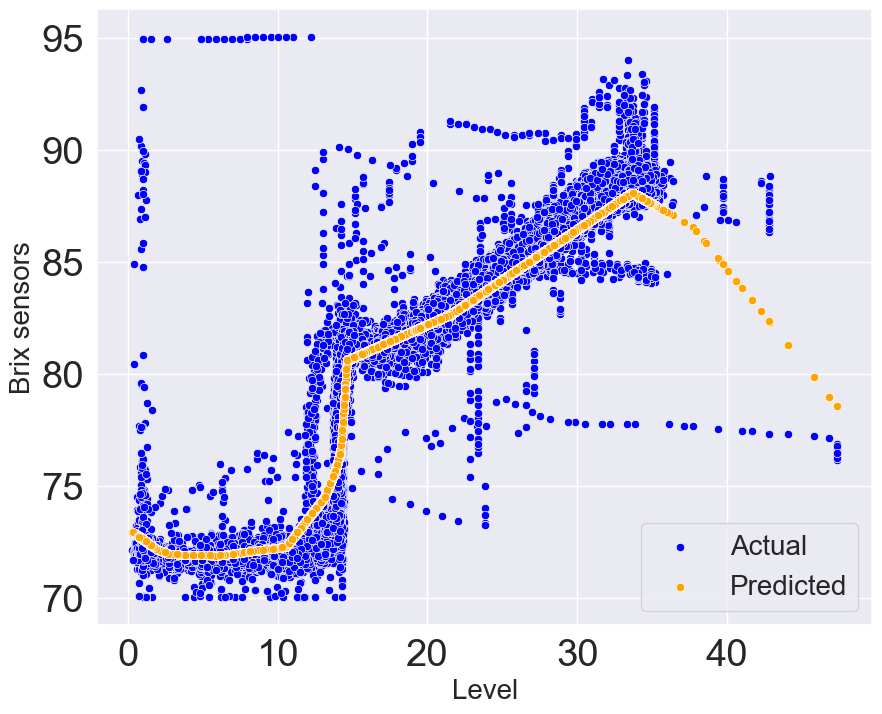

<Axes: ylabel='Density'>

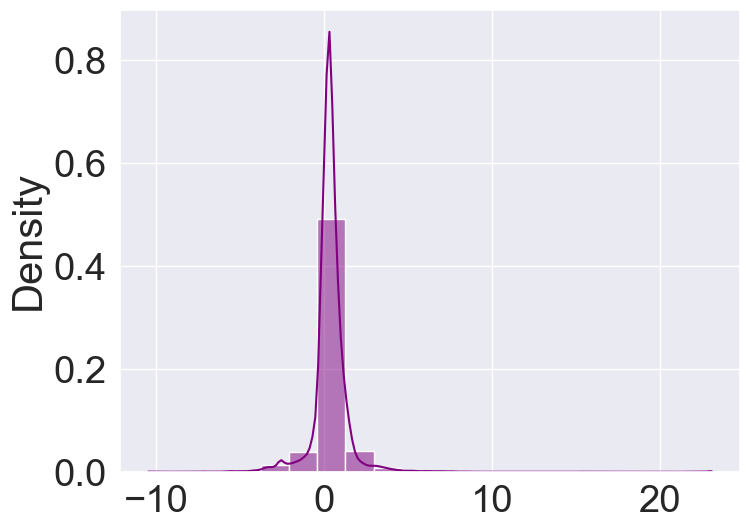

In [99]:
## Optimized NN
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Assuming OWPTB is your dataset
# Assuming 'Level' is your input feature and 'Brix sensors' is your target variable

# Extract input features (X) and target variable (y)
X = OWPTB[['Level']]
y = OWPTB['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build a more complex neural network model
model = Sequential()
model.add(Dense(64, input_dim=1, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='linear'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=0)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled).flatten()

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100


# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'R-squared (R2): {r2:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')

# Plot actual vs predicted
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_test['Level'], y=y_test,color='blue' ,label='Actual')
sns.scatterplot(x=X_test['Level'], y=y_pred,color='orange', label='Predicted')
plt.xlabel('Level',fontsize=20)
plt.ylabel('Brix sensors',fontsize=20)
plt.legend(fontsize=20)
plt.show()
# Calculate prediction error for NN
error_nn = y_test.values.flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_nn, bins=20, kde=True, color='purple', stat='density')




C:\Users\morebo\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


301/301 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step
Mean Absolute Percentage Error (MAPE): 0.69%
Mean Squared Error (MSE): 1.23
R-squared (R2): 0.94
Mean Absolute Error (MAE): 0.57


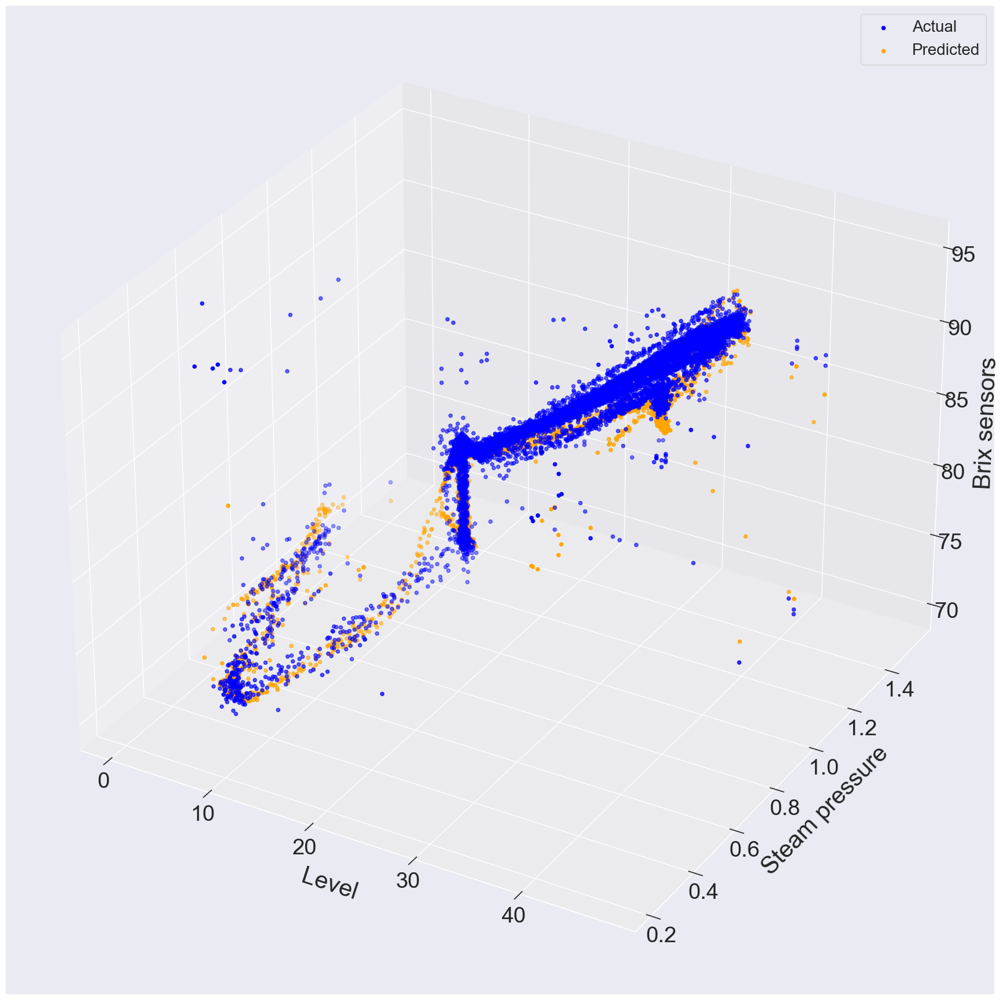

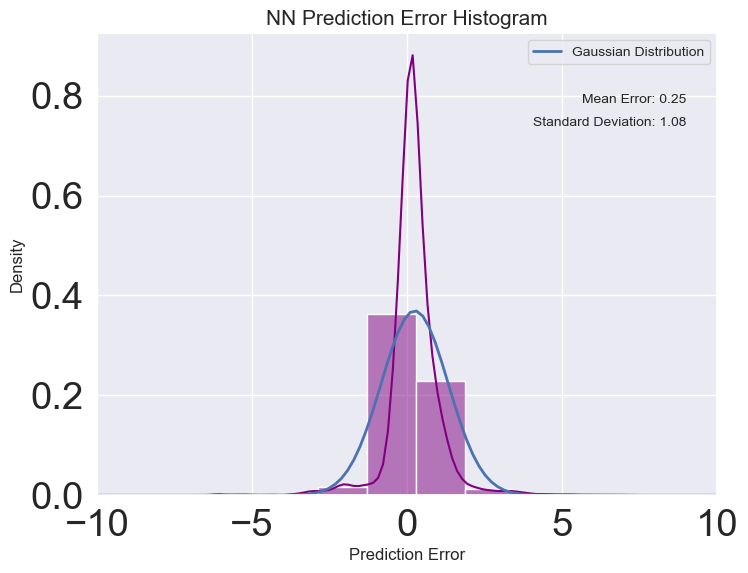

In [26]:
## Multivariate Optimized NN based on Steam pressure and Level
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import norm

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Assuming OWPTB is your dataset
# Assuming 'Level' and 'Steam pressure' are your input features, and 'Brix sensors' is your target variable

# Extract input features (X) and target variable (y)
X = OWPTB[['Level', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Build a more complex neural network model
model = Sequential()
model.add(Dense(64, input_dim=2, activation='relu'))  # Two input features
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='linear'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=0)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled).flatten()

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'R-squared (R2): {r2:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')

from mpl_toolkits.mplot3d import Axes3D

# Assuming 'Level' and 'Steam pressure' are your input features
level = X_test['Level']
steam_pressure = X_test['Steam pressure']
actual_brix = y_test
predicted_brix = y_pred

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(level, steam_pressure, actual_brix, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(level, steam_pressure, predicted_brix, c='orange', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=20)
plt.show()


# Convert Series to numpy arrays
y_test_array = y_test.to_numpy().flatten()
y_pred_array = y_pred.flatten()

# Calculate prediction error for NN
error_nn = y_test_array - y_pred_array

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_nn, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_nn = np.mean(error_nn)
std_error_nn = np.std(error_nn)

# Generate values for Gaussian curve
x_nn = np.linspace(-10, 10, 100)
pdf_nn = norm.pdf(x_nn, mean_error_nn, std_error_nn)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_nn, pdf_nn, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('NN Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()



301/301 [==============================] - 1s 4ms/step
Mean Absolute Percentage Error (MAPE): 0.89%
Mean Squared Error (MSE): 1.43
R-squared (R2): 0.93
Mean Absolute Error (MAE): 0.72


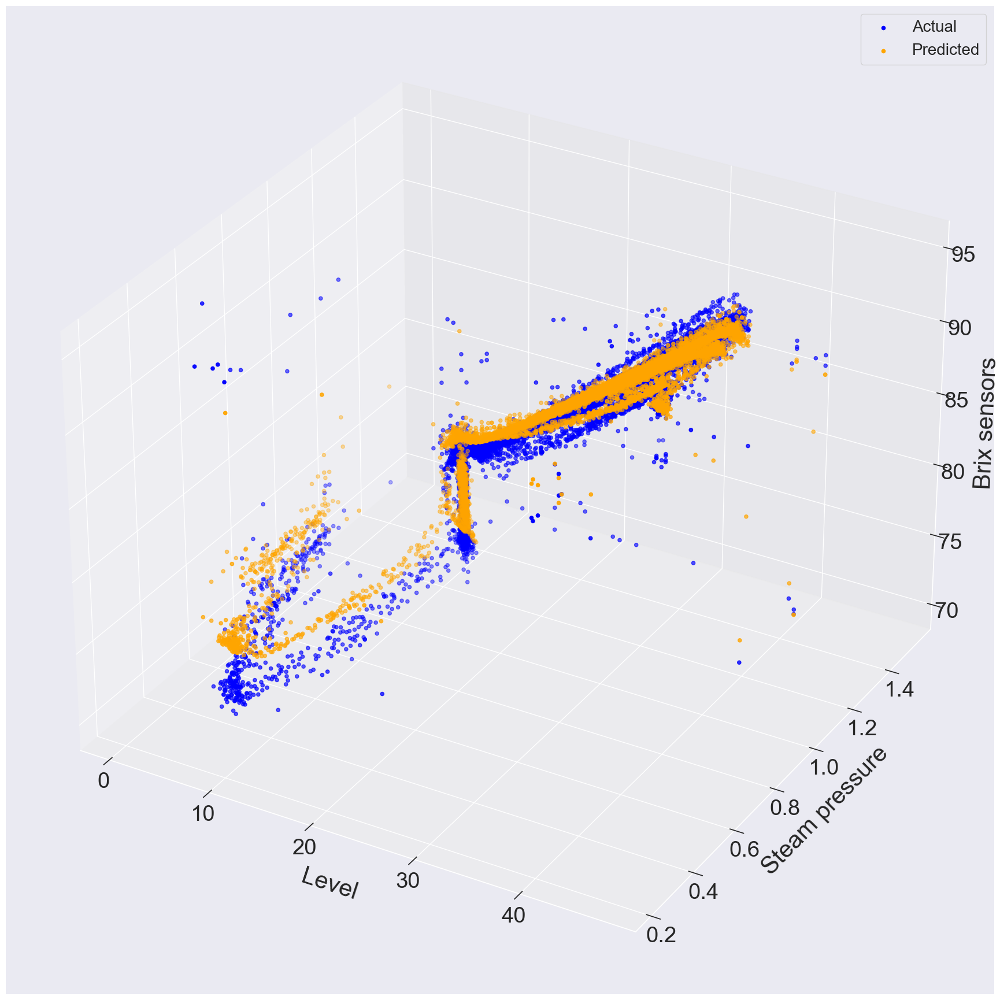

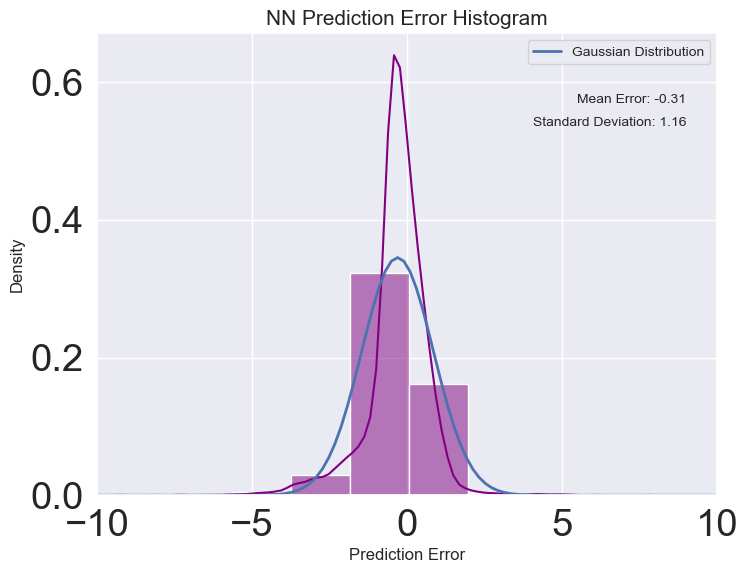

In [69]:
## Multivariate Optimized NN based on Level, Steam pressure and Vacuum pressure
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import norm

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Assuming OWPTB is your dataset
# Assuming 'Level' and 'Steam pressure' are your input features, and 'Brix sensors' is your target variable

# Extract input features (X) and target variable (y)
X = OWPTB[['Level', 'Vacuum pressure','Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Build a more complex neural network model
model = Sequential()
model.add(Dense(64, input_dim=3, activation='relu'))  # Two input features
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='linear'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=0)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled).flatten()

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'R-squared (R2): {r2:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')

from mpl_toolkits.mplot3d import Axes3D

# Assuming 'Level' and 'Steam pressure' are your input features
level = X_test['Level']
steam_pressure = X_test['Steam pressure']
actual_brix = y_test
predicted_brix = y_pred

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(level, steam_pressure, actual_brix, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(level, steam_pressure, predicted_brix, c='orange', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=20)
plt.show()


# Convert Series to numpy arrays
y_test_array = y_test.to_numpy().flatten()
y_pred_array = y_pred.flatten()

# Calculate prediction error for NN
error_nn = y_test_array - y_pred_array

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_nn, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_nn = np.mean(error_nn)
std_error_nn = np.std(error_nn)

# Generate values for Gaussian curve
x_nn = np.linspace(-10, 10, 100)
pdf_nn = norm.pdf(x_nn, mean_error_nn, std_error_nn)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_nn, pdf_nn, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('NN Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()



301/301 [==============================] - 0s 1ms/step
Mean Absolute Percentage Error (MAPE): 1.64%
Mean Squared Error (MSE): 5.19
R-squared (R2): 0.75
Mean Absolute Error (MAE): 1.36


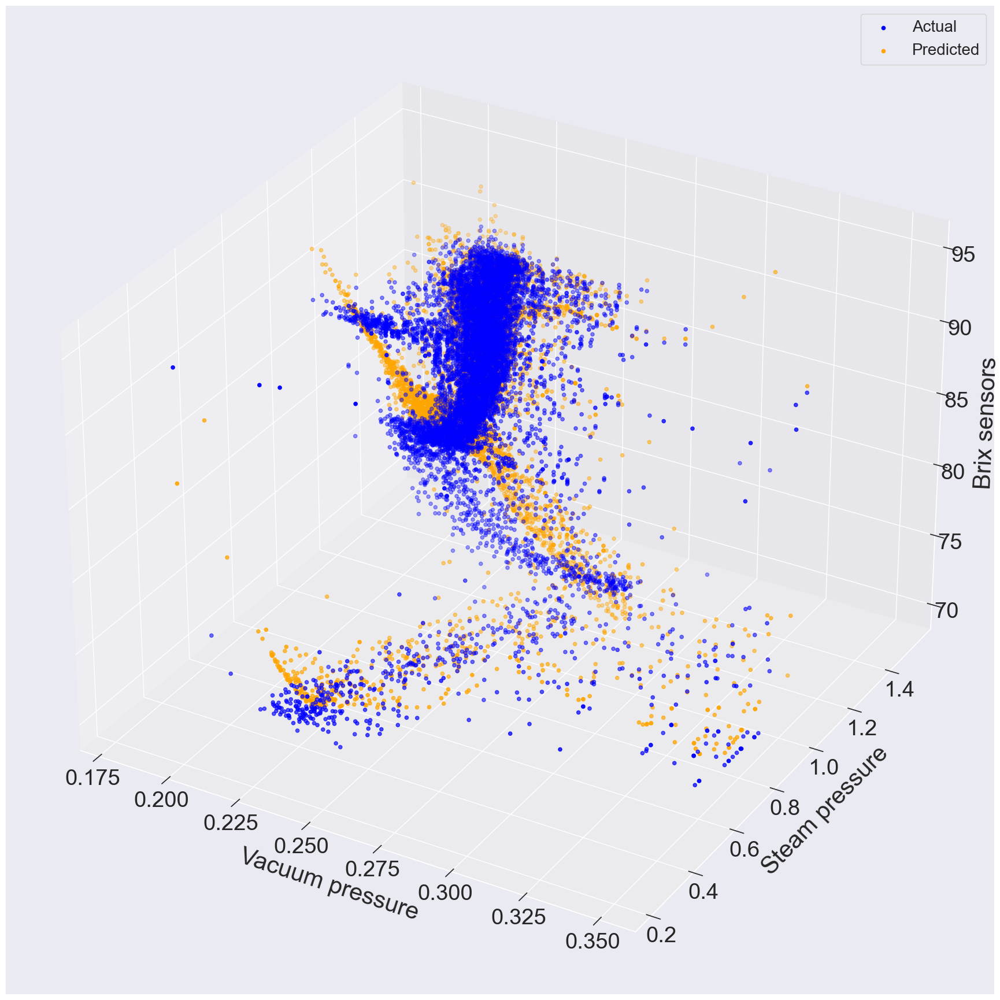

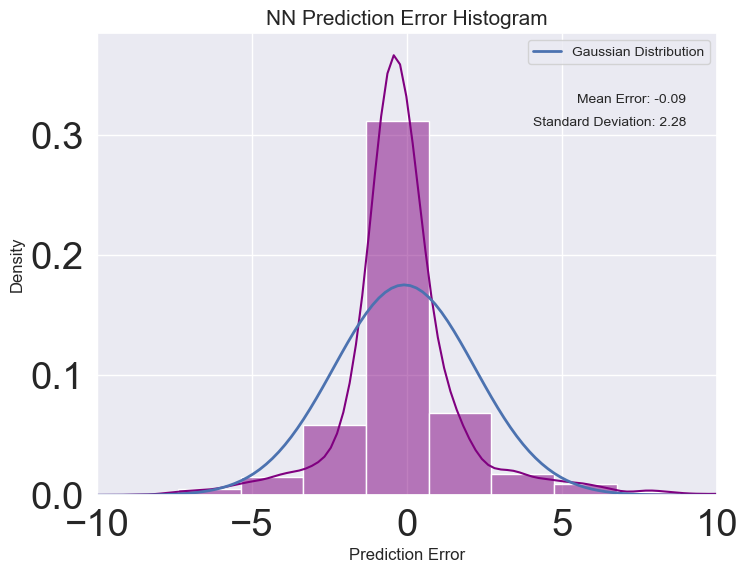

In [55]:
## Multivariate Optimized NN based on Vaccum pressure and Steam pressure
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import norm

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Assuming OWPTB is your dataset
# Assuming 'Level' and 'Steam pressure' are your input features, and 'Brix sensors' is your target variable

# Extract input features (X) and target variable (y)
X = OWPTB[['Vacuum pressure', 'Steam pressure']]
y = OWPTB['Brix sensors']

# Split the data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Build a more complex neural network model
model = Sequential()
model.add(Dense(64, input_dim=2, activation='relu'))  # Two input features
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='linear'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=0)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled).flatten()

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'R-squared (R2): {r2:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')

from mpl_toolkits.mplot3d import Axes3D

# Assuming 'Vacuum pressure' and 'Steam pressure' are your input features
vacuum_pressure = X_test['Vacuum pressure']
steam_pressure = X_test['Steam pressure']
actual_brix = y_test
predicted_brix = y_pred

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(vacuum_pressure, steam_pressure, actual_brix, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(vacuum_pressure, steam_pressure, predicted_brix, c='orange', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Vacuum pressure',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
fig.tight_layout()


# Show the plot
plt.legend(fontsize=20)
plt.show()


# Convert Series to numpy arrays
y_test_array = y_test.to_numpy().flatten()
y_pred_array = y_pred.flatten()

# Calculate prediction error for NN
error_nn = y_test_array - y_pred_array

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_nn, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_nn = np.mean(error_nn)
std_error_nn = np.std(error_nn)

# Generate values for Gaussian curve
x_nn = np.linspace(-10, 10, 100)
pdf_nn = norm.pdf(x_nn, mean_error_nn, std_error_nn)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_nn, pdf_nn, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_nn:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('NN Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()





# SVR

Mean Absolute Percentage Error (MAPE): 0.91%
Mean Squared Error (MSE): 2.39
R-squared (R2): 0.89
Mean Absolute Error (MAE): 0.70


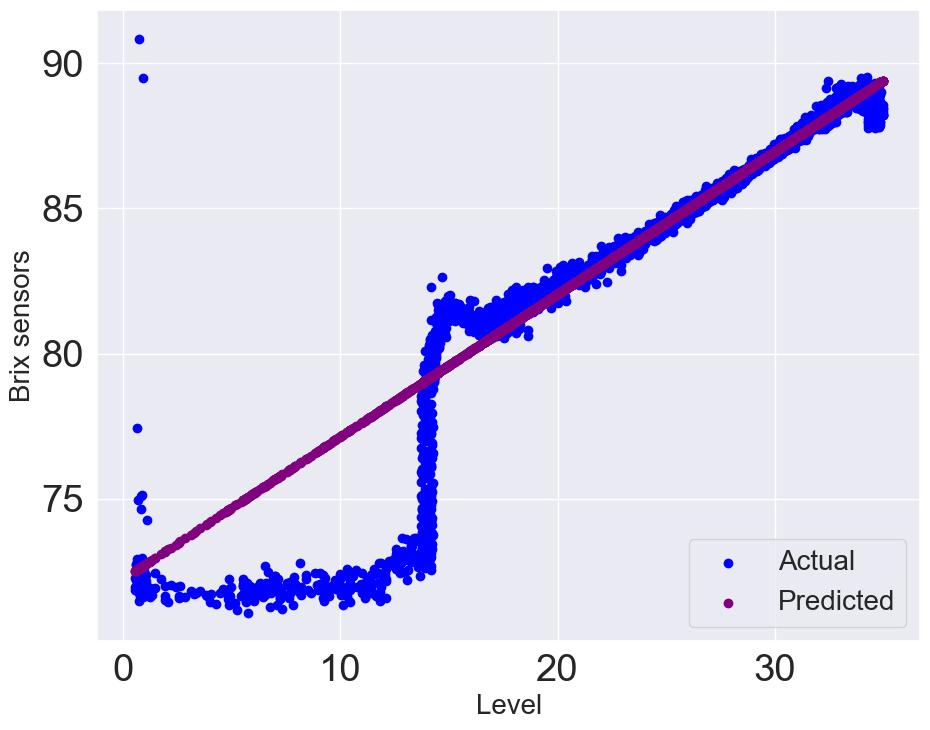

In [76]:
## SVM regressioner
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level'

# Extract relevant data
data = OWPTB[['Level', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create an SVM regressor
svm_regressor = SVR(kernel='linear')
svm_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")




# Plot actual vs predicted values
plt.figure(figsize=(10, 8))
plt.scatter(X_test['Level'], y_test,color='blue', label='Actual')
plt.scatter(X_test['Level'], y_pred, label='Predicted',color='purple', marker='o')
plt.xlabel('Level',fontsize=20)
plt.ylabel('Brix sensors',fontsize=20)
plt.legend(fontsize=20,loc='lower right')

# Show the plots
plt.tight_layout()
plt.show()




Mean Absolute Percentage Error (MAPE): 0.64%
Mean Squared Error (MSE): 1.32
R-squared (R2): 0.94
Mean Absolute Error (MAE): 0.52


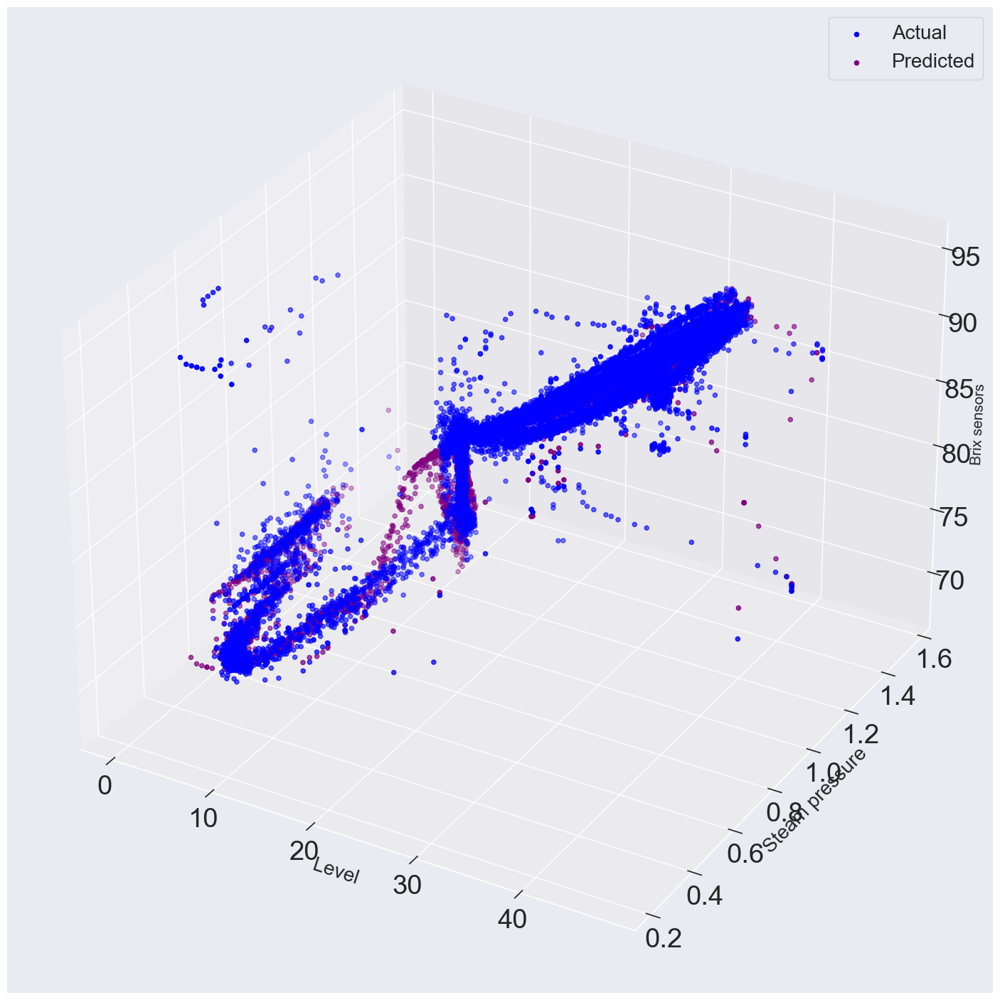

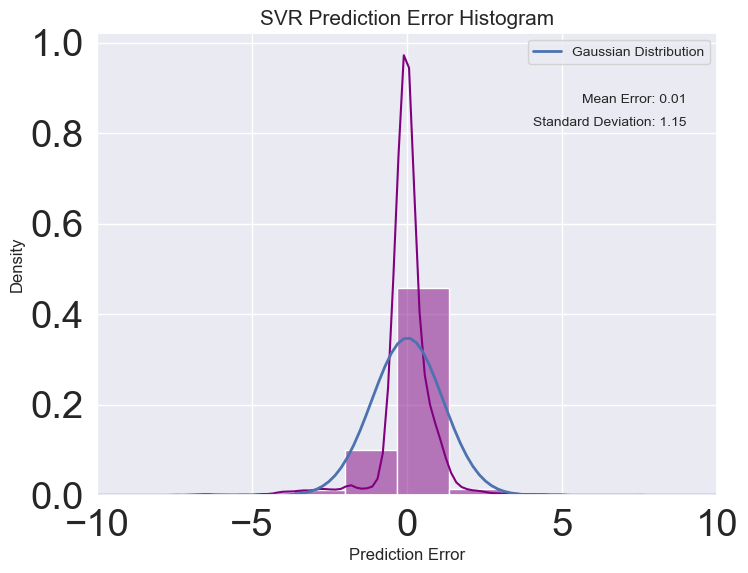

In [32]:
#SVR based on level and steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm


# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Level', 'Steam pressure', 'Brix sensors']]


# Split the data into features (X) and target variable (y)
X = data[['Level', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create an SVM regressor
svm_regressor = SVR(kernel='rbf')
svm_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")



# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_pred, c='Purple', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',fontsize=20)
ax.set_ylabel('Steam pressure',fontsize=20)
ax.set_zlabel('Brix sensors',fontsize=15)


# Show the plot
plt.legend(fontsize=20)
plt.show()


# Calculate prediction error for SVR
error_svr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_svr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_svr = np.mean(error_svr)
std_error_svr = np.std(error_svr)

# Generate values for Gaussian curve
x_svr = np.linspace(-10, 10, 100)
pdf_svr = norm.pdf(x_svr, mean_error_svr, std_error_svr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_svr, pdf_svr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('SVR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()

Mean Absolute Percentage Error (MAPE): 0.56%
Mean Squared Error (MSE): 1.12
R-squared (R2): 0.95
Mean Absolute Error (MAE): 0.46


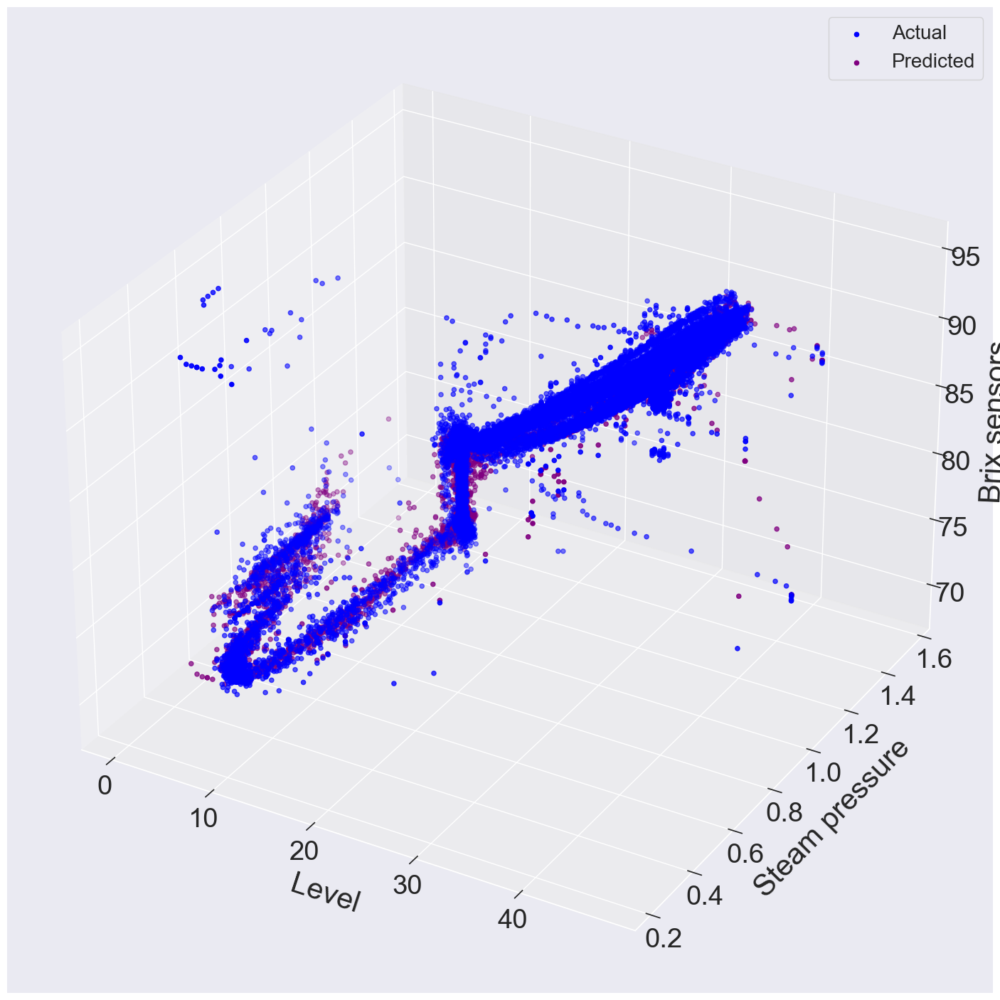

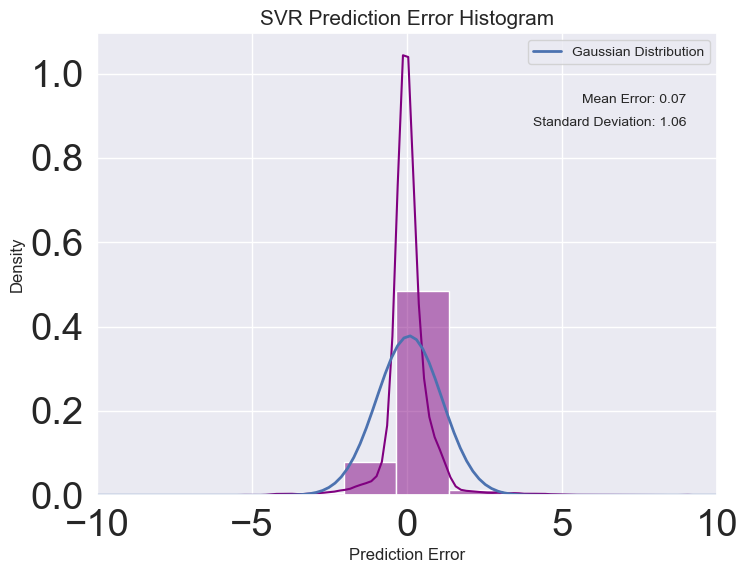

In [30]:
#SVR based on level, Vacuum pressure, steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm


# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Level', 'Vacuum pressure', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level', 'Vacuum pressure', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create an SVM regressor
svm_regressor = SVR(kernel='rbf')
svm_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")



# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_pred, c='Purple', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)



# Show the plot
plt.legend(fontsize=20)
plt.show()


# Calculate prediction error for SVR
error_svr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_svr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_svr = np.mean(error_svr)
std_error_svr = np.std(error_svr)

# Generate values for Gaussian curve
x_svr = np.linspace(-10, 10, 100)
pdf_svr = norm.pdf(x_svr, mean_error_svr, std_error_svr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_svr, pdf_svr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('SVR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()

Mean Absolute Percentage Error (MAPE): 1.54%
Mean Squared Error (MSE): 6.20
R-squared (R2): 0.71
Mean Absolute Error (MAE): 1.29


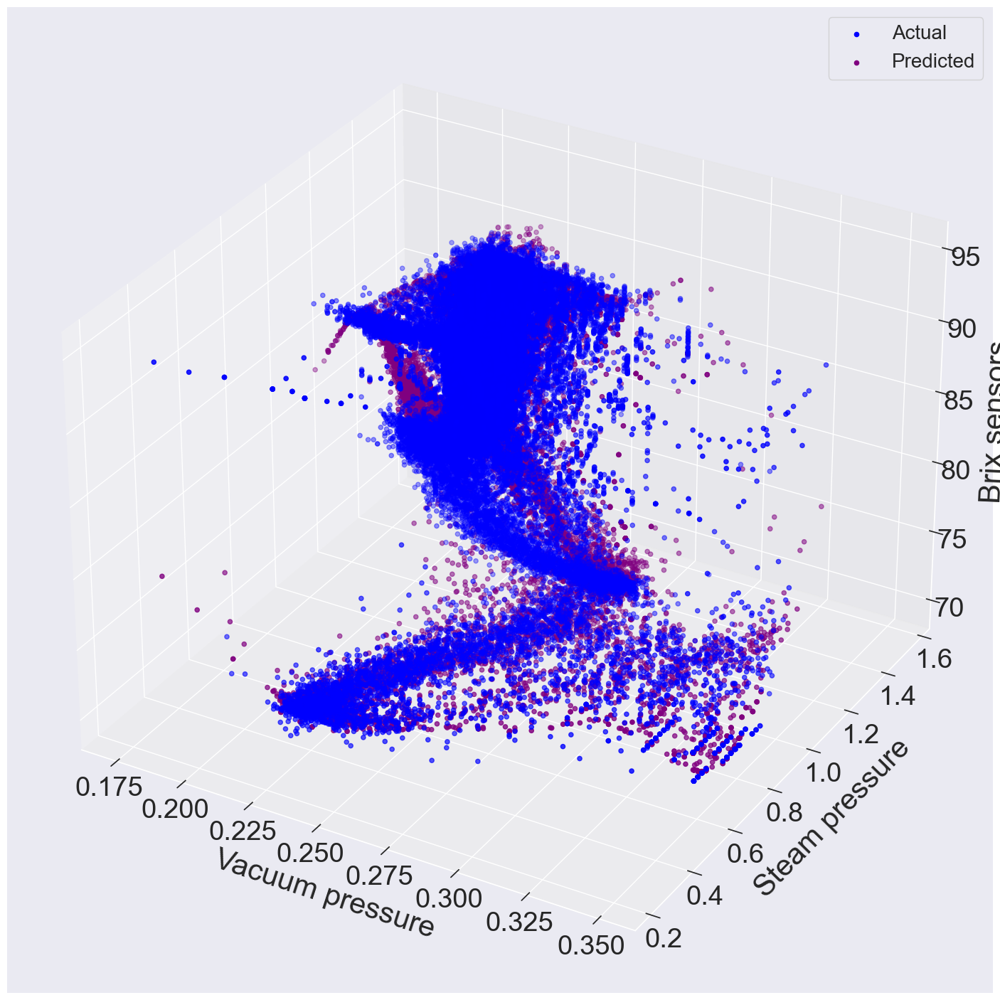

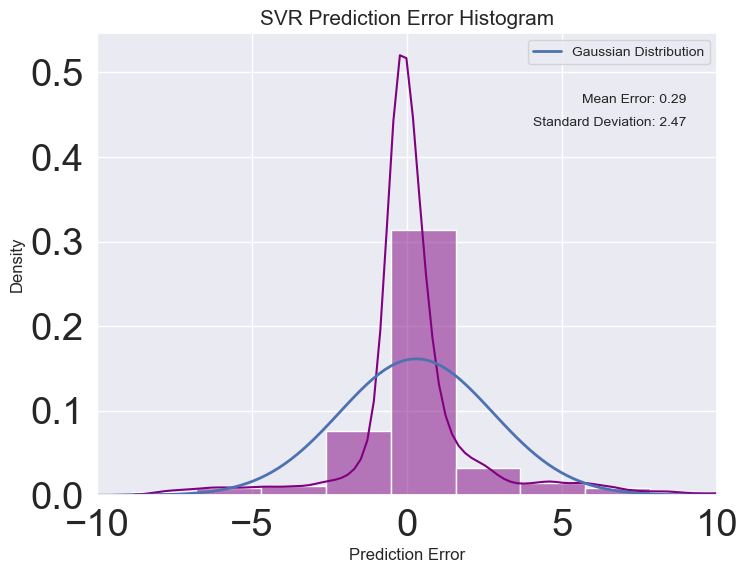

In [31]:
#SVR based on vacuum pressure and steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm


# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Vacuum pressure', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Vacuum pressure', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create an SVM regressor
svm_regressor = SVR(kernel='rbf')
svm_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")



# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_pred, c='Purple', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Vacuum pressure',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)
ax.tick_params(axis='both', which='major')


# Show the plot
plt.legend(fontsize=20)
plt.show()


# Calculate prediction error for SVR
error_svr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_svr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_svr = np.mean(error_svr)
std_error_svr = np.std(error_svr)

# Generate values for Gaussian curve
x_svr = np.linspace(-10, 10, 100)
pdf_svr = norm.pdf(x_svr, mean_error_svr, std_error_svr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_svr, pdf_svr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_svr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('SVR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()

# DTR

Mean Absolute Percentage Error (MAPE): 0.44%
Mean Squared Error (MSE): 0.77
R-squared (R2): 0.97
Mean Absolute Error (MAE): 0.35


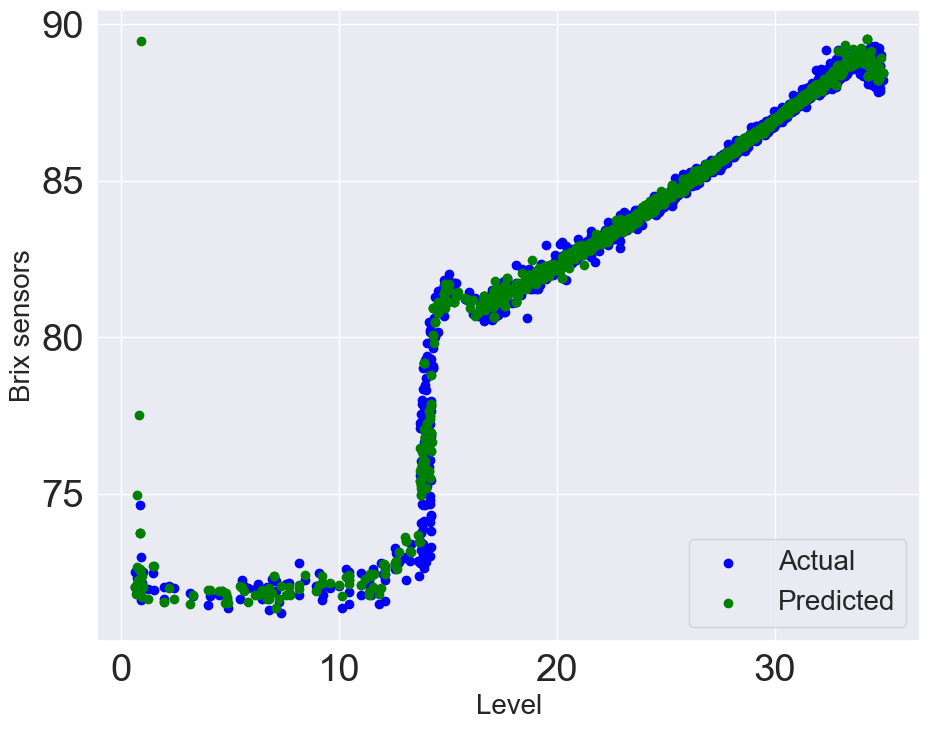

In [43]:
#Decision Tree regressor
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level'

# Extract relevant data
data = OWPTB[['Level', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree regressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = tree_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rse = np.sqrt(mse) / np.mean(y_test)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100


# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")


# Plot actual vs predicted values
plt.figure(figsize=(10, 8))
plt.scatter(X_test['Level'], y_test, color='blue', label='Actual')
plt.scatter(X_test['Level'], y_pred, color='green', label='Predicted', marker='o')
plt.xlabel('Level',fontsize=20)
plt.ylabel('Brix sensors',fontsize=20)
plt.legend(fontsize=20)

# Show the plots
plt.tight_layout()
plt.show()



Mean Absolute Percentage Error (MAPE): 0.44%
Mean Squared Error (MSE): 0.88
R-squared (R2): 0.96
Mean Absolute Error (MAE): 0.36


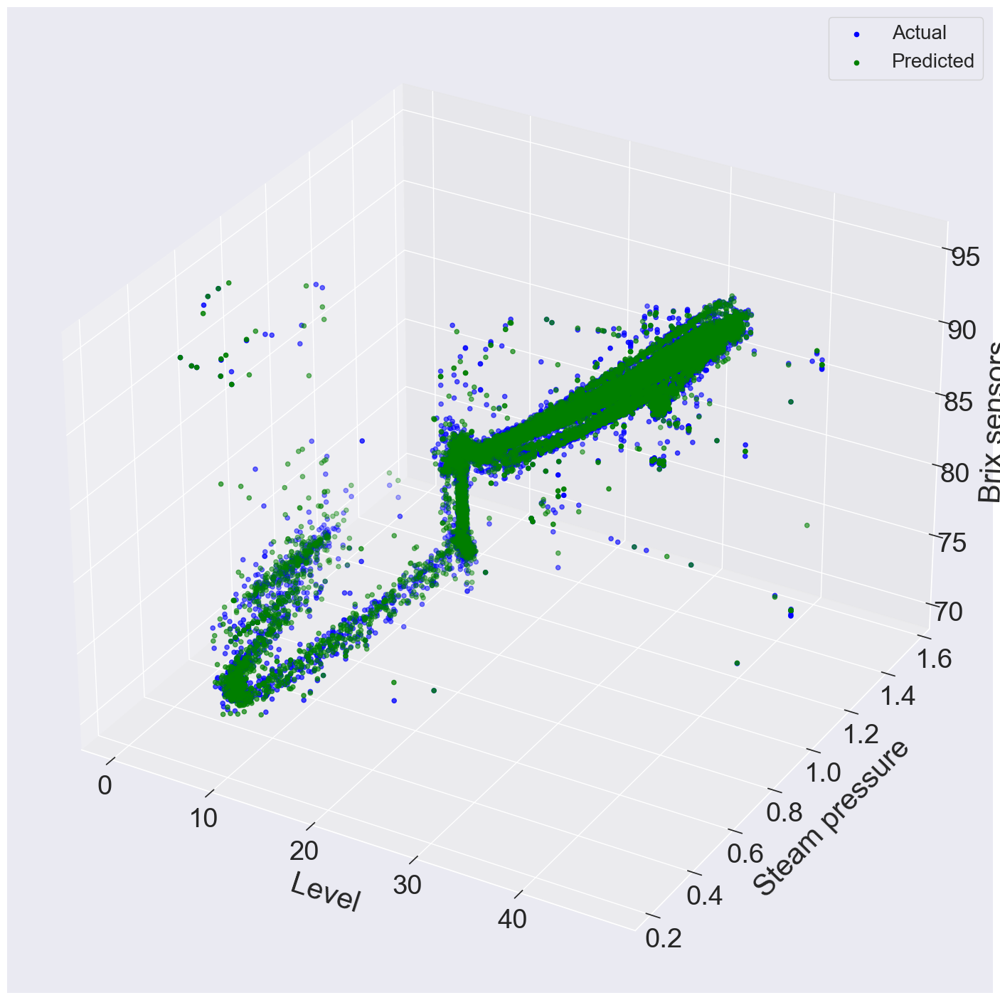

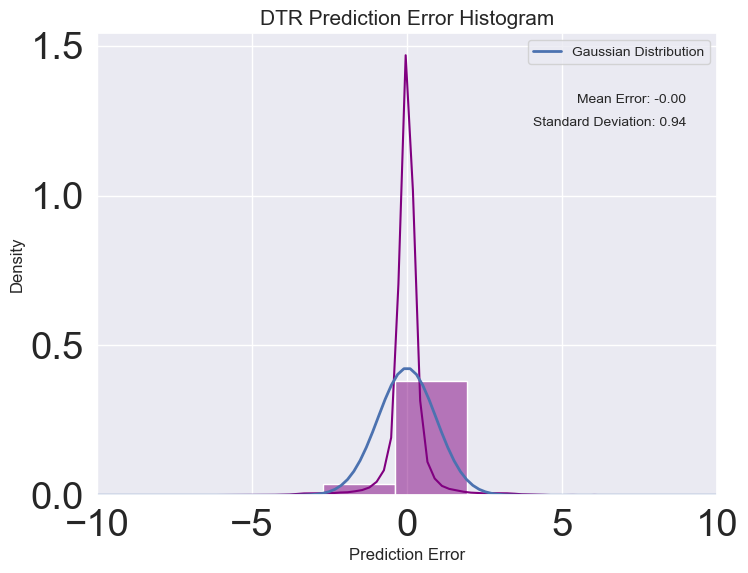

In [28]:
#DTR based on level and steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Level' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Level', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree regressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = tree_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_pred, c='green', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)


# Show the plot
plt.legend(fontsize=20)
plt.show()

# Calculate prediction error for DTR
error_dtr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_dtr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_dtr = np.mean(error_dtr)
std_error_dtr = np.std(error_dtr)

# Generate values for Gaussian curve
x_dtr = np.linspace(-10, 10, 100)
pdf_dtr = norm.pdf(x_dtr, mean_error_dtr, std_error_dtr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_dtr, pdf_dtr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('DTR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()


Mean Absolute Percentage Error (MAPE): 0.65%
Mean Squared Error (MSE): 2.64
R-squared (R2): 0.87
Mean Absolute Error (MAE): 0.53


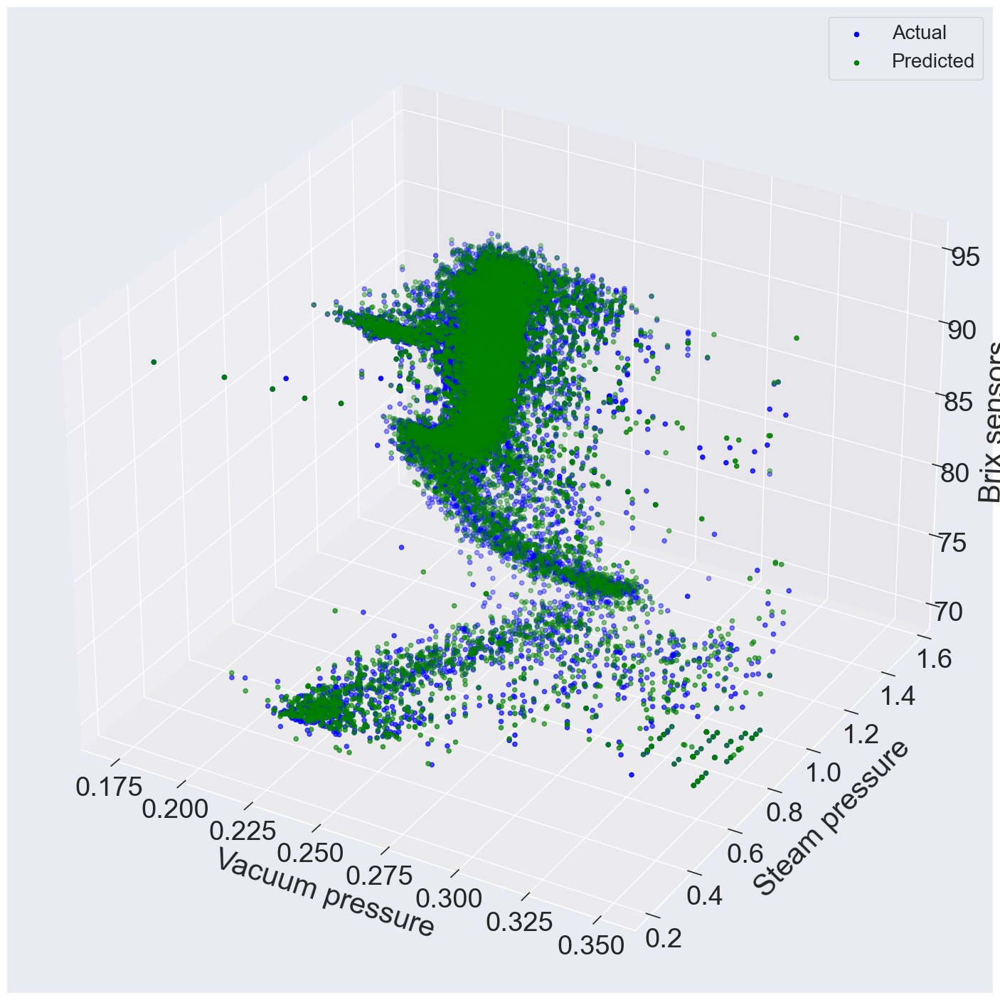

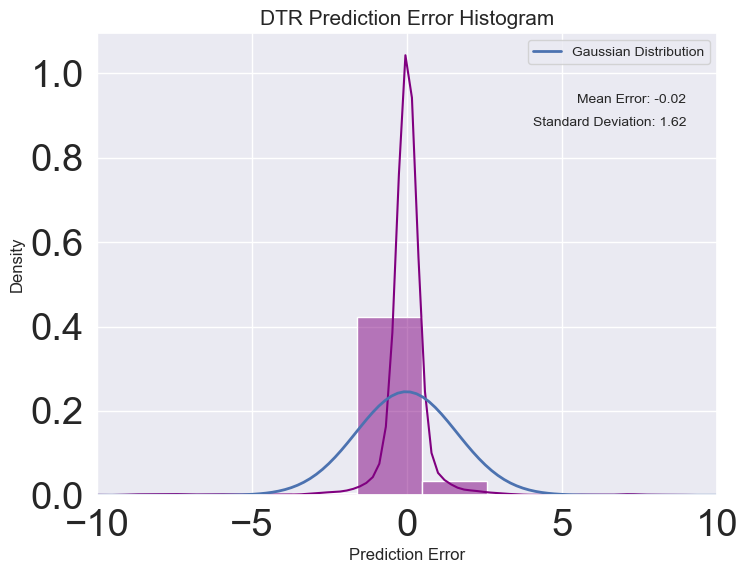

In [59]:
#DTR based on vacuum pressure and steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Vacuum pressure' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Vacuum pressure', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Vacuum pressure', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree regressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = tree_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Vacuum pressure'], X_test['Steam pressure'], y_pred, c='green', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Vacuum pressure',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)


# Show the plot
plt.legend(fontsize=20)
plt.show()

# Calculate prediction error for DTR
error_dtr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_dtr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_dtr = np.mean(error_dtr)
std_error_dtr = np.std(error_dtr)

# Generate values for Gaussian curve
x_dtr = np.linspace(-10, 10, 100)
pdf_dtr = norm.pdf(x_dtr, mean_error_dtr, std_error_dtr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_dtr, pdf_dtr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('DTR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()


Mean Absolute Percentage Error (MAPE): 0.40%
Mean Squared Error (MSE): 0.65
R-squared (R2): 0.97
Mean Absolute Error (MAE): 0.32


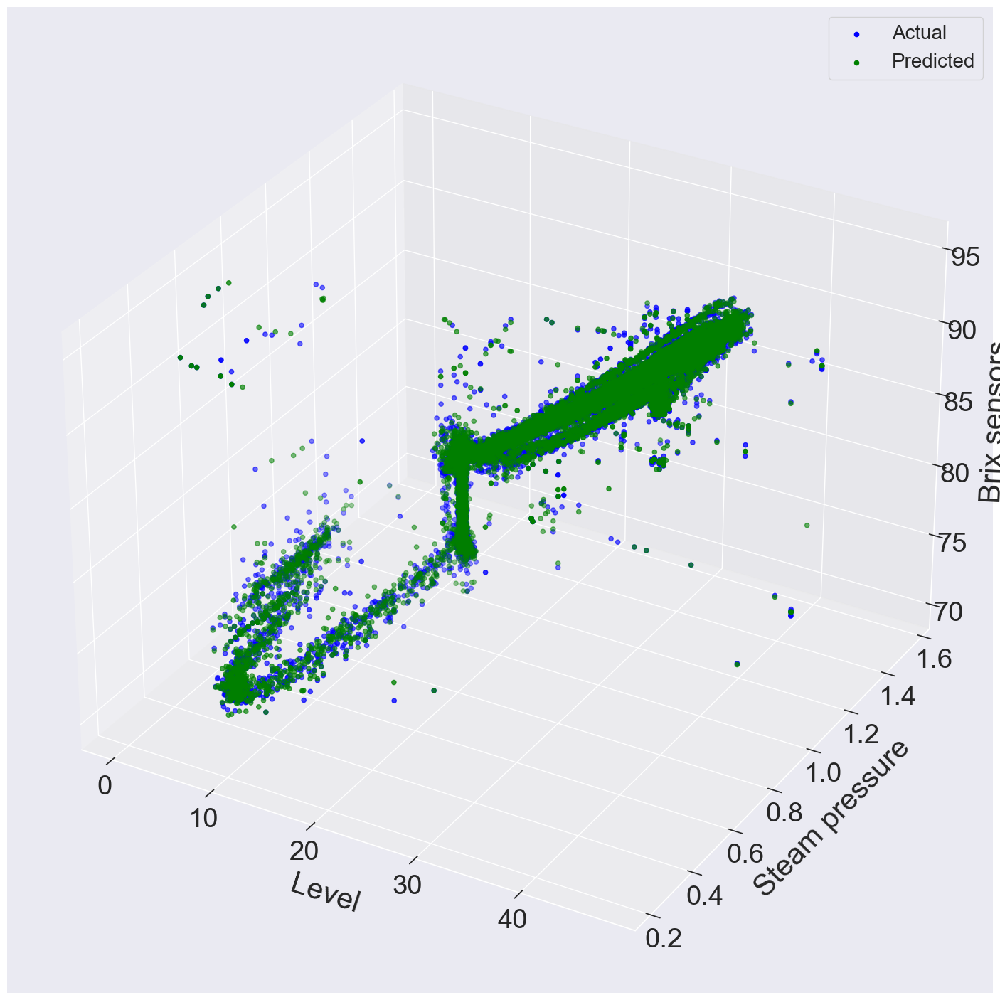

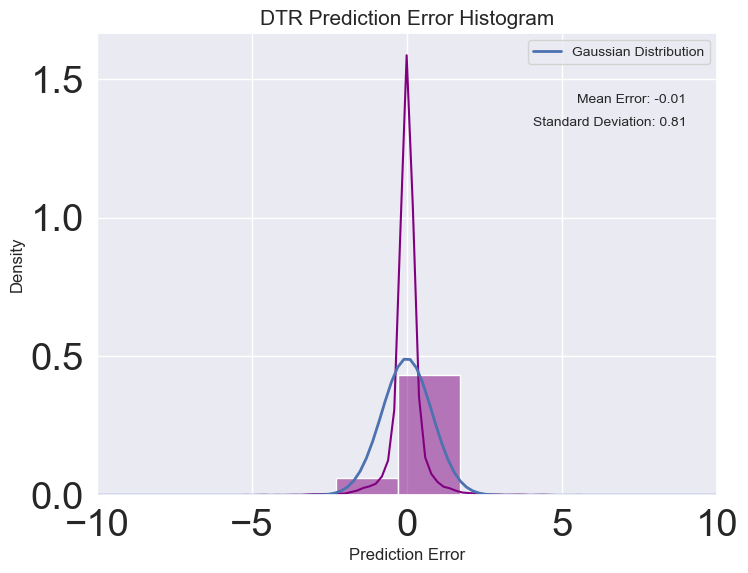

In [61]:
#DTR based on Level, vacuum pressure,and steam pressure
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm

# Assuming you have your OWPTB dataframe and want to predict 'Brix sensors' based on 'Vacuum pressure' and 'Steam pressure'

# Extract relevant data
data = OWPTB[['Level','Vacuum pressure', 'Steam pressure', 'Brix sensors']]

# Split the data into features (X) and target variable (y)
X = data[['Level','Vacuum pressure', 'Steam pressure']]
y = data['Brix sensors']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree regressor
tree_regressor = DecisionTreeRegressor(random_state=42)
tree_regressor.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = tree_regressor.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Print evaluation metrics
print(f'Mean Absolute Percentage Error (MAPE): {mape:.2f}%')
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R2): {r2:.2f}")
print(f"Mean Absolute Error (MAE): {mae:.2f}")

# Create a 3D plot
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for actual Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_test, c='blue', marker='o', label='Actual')

# Scatter plot for predicted Brix sensors
ax.scatter(X_test['Level'], X_test['Steam pressure'], y_pred, c='green', marker='o', label='Predicted')

# Set labels
ax.set_xlabel('Level',labelpad=20)
ax.set_ylabel('Steam pressure',labelpad=20)
ax.set_zlabel('Brix sensors',labelpad=15)


# Show the plot
plt.legend(fontsize=20)
plt.show()

# Calculate prediction error for DTR
error_dtr = y_test.to_numpy().flatten() - y_pred.flatten()

# Plotting the histogram
plt.figure(figsize=(8, 6))
sns.histplot(error_dtr, bins=20, kde=True, color='purple', stat='density')

# Calculate mean and standard deviation of the error
mean_error_dtr = np.mean(error_dtr)
std_error_dtr = np.std(error_dtr)

# Generate values for Gaussian curve
x_dtr = np.linspace(-10, 10, 100)
pdf_dtr = norm.pdf(x_dtr, mean_error_dtr, std_error_dtr)  # Gaussian distribution

# Plot Gaussian distribution curve
plt.plot(x_dtr, pdf_dtr, 'b-', linewidth=2, label='Gaussian Distribution')

# Annotate with mean and standard deviation
plt.text(0.95, 0.85, f'Mean Error: {mean_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)
plt.text(0.95, 0.80, f'Standard Deviation: {std_error_dtr:.2f}', fontsize=10, ha='right', transform=plt.gca().transAxes)

plt.xlim(-10, 10)  # Set x-axis limit from -10 to 10
plt.title('DTR Prediction Error Histogram', fontsize=15)
plt.xlabel('Prediction Error', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.grid(True)
plt.legend(fontsize=10)
plt.show()


In [31]:
# Existing code to identify start and finish indices
batch_start_end_indices = []
current_batch = None
start_index = 0

for index, row in OWPTB.iterrows():
    if current_batch is None:
        current_batch = row['Batch']
    elif current_batch != row['Batch']:
        batch_start_end_indices.append((start_index, index - 1))
        current_batch = row['Batch']
        start_index = index

# Append the last batch's start and end index
batch_start_end_indices.append((start_index, len(OWPTB) - 1))

#OWPTRD: Residence Time of different Batch
# Create a new dataframe with Time and Batch columns
OWPTRD = pd.DataFrame(columns=['Time', 'Batch'])

# Populate the new dataframe with start and finish points along with corresponding time values
for i, (start, end) in enumerate(batch_start_end_indices):
    start_time = OWPTB.loc[start, 'Time']
    end_time = OWPTB.loc[end, 'Time']
    OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
    OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)

# Sort the dataframe based on the Time column
OWPTRD = OWPTRD.sort_values(by=['Time'])

# Reset the index of the dataframe
OWPTRD = OWPTRD.reset_index(drop=True)

# Display the resulting dataframe
HTML(OWPTRD .to_html(index=False))


C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future 

C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future 

C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future 

C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ve

C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': end_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  OWPTRD = OWPTRD.append({'Time': start_time, 'Batch': i}, ignore_index=True)
C:\Users\morebo\AppData\Local\Temp\ipykernel_3208\4035185728.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future 

Time,Batch
2022-10-01 00:00:00,0
2022-10-01 01:13:00,0
2022-10-01 03:22:00,1
2022-10-01 05:25:00,1
2022-10-01 07:00:00,2
2022-10-01 09:01:00,2
2022-10-01 09:50:00,3
2022-10-01 12:03:00,3
2022-10-01 13:02:00,4
2022-10-01 15:15:00,4


In [33]:
# Assuming 'Time' is in datetime format
OWPTRD['Time'] = pd.to_datetime(OWPTRD['Time'])

# Group the data by 'Batch' and find the duration for each batch
Residence_Time = OWPTRD.groupby('Batch')['Time'].apply(lambda x: x.max() - x.min())

# Display the durations for each batch
print(Residence_Time)

Batch
0     0 days 01:13:00
1     0 days 02:03:00
2     0 days 02:01:00
3     0 days 02:13:00
4     0 days 02:13:00
            ...      
792   0 days 01:47:00
793   0 days 01:38:00
794   0 days 01:52:00
795   0 days 01:37:00
796   0 days 00:01:00
Name: Time, Length: 797, dtype: timedelta64[ns]


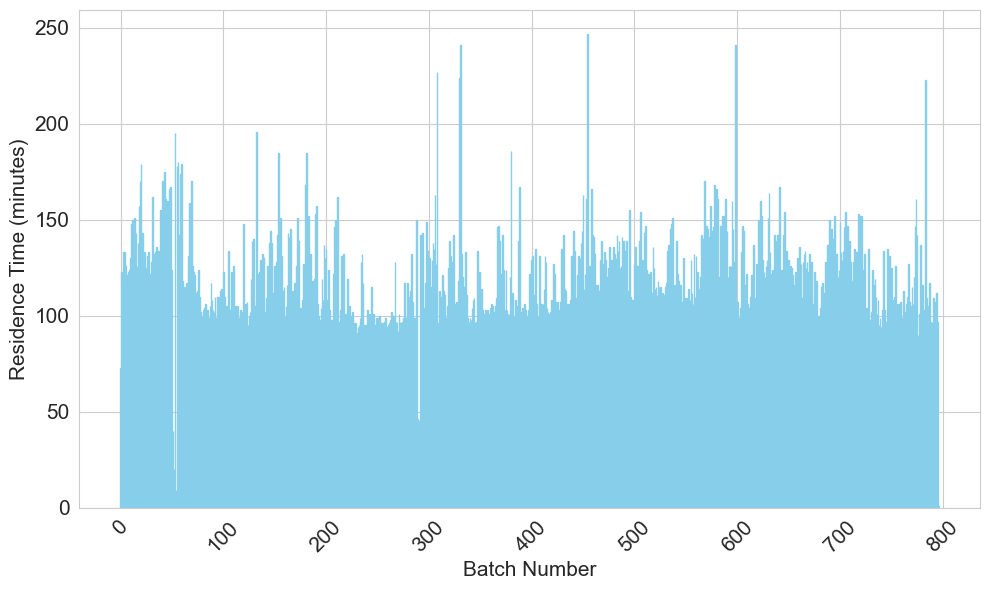

Median Residence Time: 117.00 minutes
Standard Deviation Residence Time: 24.99 minutes
Variance Residence Time: 624.26 minutes^2
IQR Residence Time: 29.00 minutes
Skewness Residence Time: 0.25
Kurtosis Residence Time: 5.55
Minimum Residence Time: 1.00 minutes
Maximum Residence Time: 247.00 minutes
Mean Residence Time: 119.68 minutes


In [45]:
# RTPM: Residence Time Based Pressure in Minute
#Convert durations to seconds for better visualization
RTPM = Residence_Time.dt.total_seconds()/60

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(Residence_Time.index, RTPM, edgecolor='skyblue')
plt.xlabel('Batch Number', fontsize=15)
plt.ylabel('Residence Time (minutes)', fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.yticks(fontsize=15)
plt.tight_layout()
plt.show()

# Calculate min, max, and mean
min_residence_time = RTPM.min()
max_residence_time = RTPM.max()
mean_residence_time = RTPM.mean()
median_residence_time = RTPM.median()
std_residence_time = RTPM.std()
var_residence_time = RTPM.var()
iqr_residence_time = RTPM.quantile(0.75) - RTPM.quantile(0.25)  # Interquartile Range
skew_residence_time = RTPM.skew()
kurt_residence_time = RTPM.kurtosis()


print(f"Median Residence Time: {median_residence_time:.2f} minutes")
print(f"Standard Deviation Residence Time: {std_residence_time:.2f} minutes")
print(f"Variance Residence Time: {var_residence_time:.2f} minutes^2")
print(f"IQR Residence Time: {iqr_residence_time:.2f} minutes")
print(f"Skewness Residence Time: {skew_residence_time:.2f}")
print(f"Kurtosis Residence Time: {kurt_residence_time:.2f}")
print(f"Minimum Residence Time: {min_residence_time:.2f} minutes")
print(f"Maximum Residence Time: {max_residence_time:.2f} minutes")
print(f"Mean Residence Time: {mean_residence_time:.2f} minutes")

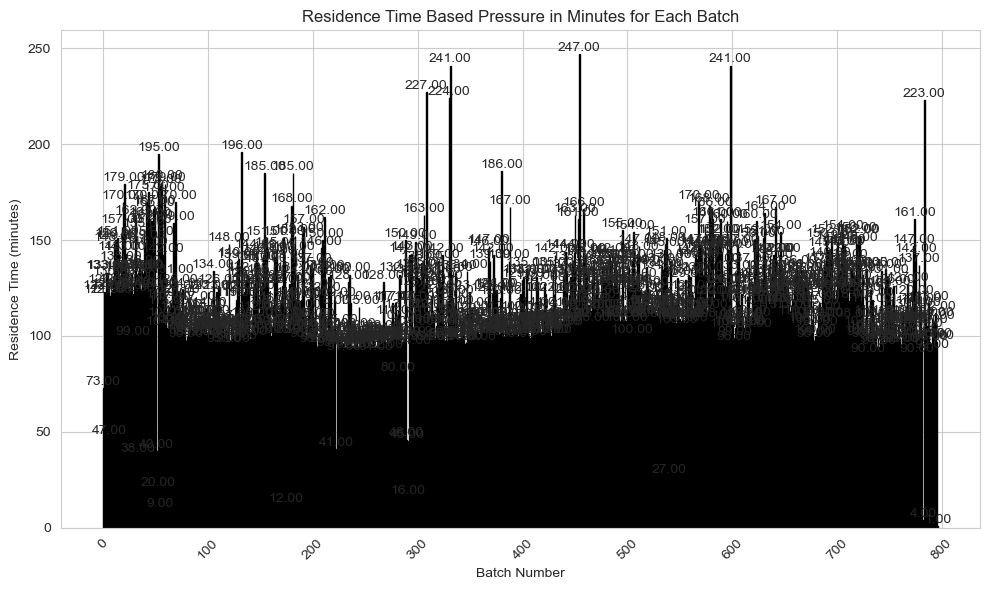

In [35]:
# RTPM: Residence Time Based Pressure in Minute
# Convert durations to seconds for better visualization
RTPM = Residence_Time.dt.total_seconds() / 60

# Create a bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(Residence_Time.index, RTPM, edgecolor='black')  # Set edgecolor to 'black'
plt.xlabel('Batch Number')
plt.ylabel('Residence Time (minutes)')
plt.title('Residence Time Based Pressure in Minutes for Each Batch')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Optionally, add labels on top of bars
for bar, rt in zip(bars, RTPM):
    plt.text(bar.get_x() + bar.get_width() / 2, rt + 0.1, f'{rt:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


In [17]:
# Assuming Residence_Time is your Series
RTPM = pd.DataFrame({'Batch': Residence_Time.index, 'ResidenceTime': RTPM.values})

# Display the resulting DataFrame
print(RTPM)

    Batch  ResidenceTime
0       0           98.0
1       1          104.0
2       2          108.0
3       3          109.0
4       4           96.0
5       5           97.0
6       6          134.0
7       7          112.0
8       8          123.0
9       9          108.0
10     10          114.0
11     11          103.0
12     12          101.0
13     13          100.0
14     14          103.0
15     15          100.0
16     16          103.0
17     17           96.0
18     18          101.0
19     19          104.0
20     20          106.0
21     21          105.0
22     22          102.0
23     23          100.0
24     24          105.0
25     25          109.0
26     26          146.0
27     27          147.0
28     28          139.0
29     29          109.0
30     30          122.0
31     31          142.0
32     32          124.0
33     33          103.0
34     34          124.0
35     35          103.0
36     36          101.0
37     37          101.0
38     38          120.0
